# Introduction
Analysis of simulations relating to polymer models of chromatin

### Imports
Import libraries and write settings here.

In [74]:
# Notebooks specific imports
from IPython import get_ipython
ipython = get_ipython()
#Expand notebook display

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))
# Display all cell outputs
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'
# autoreload extension
if 'autoreload' not in ipython.extension_manager.loaded:
    %load_ext autoreload
%autoreload 2

# Basic useful imports
import re
import time
import yaml
from pprint import pprint
from pathlib import Path
import h5py

# Data manipulation
import numpy as np
from scipy.special import erf
from scipy.integrate import quad
import scipy.stats as stats

# Visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import (Circle, RegularPolygon, FancyArrowPatch, ArrowStyle)
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator, NullFormatter)
import matplotlib.colors as colors

# From AMSOS_analysis.py
import amsos_analysis as aa
from amsos_analysis.colormaps import register_cmaps

### Style settings

In [64]:
graph_sty = {
    "axes.titlesize": 20,
    "axes.labelsize": 24,
    "lines.linewidth": 2,
    "lines.markersize": 10,
    "xtick.labelsize": 24,
    "ytick.labelsize": 24,
    "font.size": 20,
    "font.sans-serif": 'Helvetica',
    "text.usetex": False,
    'mathtext.fontset': 'cm',
}
plt.style.use(graph_sty)
        

In [67]:
register_cmaps()
#plt.rcParams['image.cmap'] = 'emct8'
#plt.rcParams['image.cmap'] = 'warm'
plt.rcParams['image.cmap'] = 'YlOrRd'

### Location

In [6]:
ws_path = Path('/home/alamson/DATA/Chromatin/')
mnt_path = Path.home() / 'projects/DATA/Chromatin/'
ceph_path = Path.home() / 'ceph/DATA/Chromatin/'

# Functions

## Physical scale calculations

In [6]:
def get_drag_coeff(bead_rad, viscosity):
    ''' Dimensions of Length/(Time*Force) = Length^2/(Time*Energy)'''
    return 6.*np.pi*viscosity*bead_rad

print(get_drag_coeff(.01, 1000))

188.4955592153876


In [7]:
def get_char_time(bead_diam, viscosity, kT=.00411):
    ''' Characteristic time i.e. the time it takes for bead to diffuse its diameter '''
    return 4.*np.pi*viscosity*np.power(bead_diam, 3)/kT

print(get_char_time(.01, 1000.)) # in sec

3.0575110983842273


In [8]:
def get_poly_diffuse_dist(time, n_beads, bead_diam, viscosity, frac_dim=.5, kT=.00411 ):
    return np.sqrt(kT*time/(np.pi*viscosity*bead_diam*np.power(n_beads, frac_dim)))

print(get_poly_diffuse_dist(100*3600, 512, .02, 1000.)) # In microns

1.0201516513282987


In [9]:
def get_rouse_time(n_beads, bead_diam, viscosity, kT=.00411 ):
    return 2.*viscosity*np.power(bead_diam,3)*n_beads*n_beads/(3*np.pi*kT)

print(get_rouse_time(512, .02, 1000.)/3600) # In hours

30.077688313513075


In [10]:
def get_link_relax_time(bead_rad, viscosity, spring_const):
    return (6.*np.pi*viscosity*bead_rad)/spring_const

print(get_link_relax_time(.01, 1000, 3650)) # in seconds

0.05164261896311989


In [11]:
def get_pfract(n_chrom, rad_chrom, n_crowd, rad_crowd, rad_sys, pcoeff=.75):
    return (n_chrom*(rad_chrom**3) + n_crowd*(rad_crowd**3))/(rad_sys**3 *.75) 

print(get_pfract(700, .01, 100000, .01, 1.05))

0.11598459489615955


## Radial distribution function

In [12]:
def rad_distr_func_avg(dist_mat, nbins=100, hist_max=.5, orig_density=1.):
    """TODO: Docstring for cylindrical histogram.
    @param pos_mat TODO
    @param nbins TODO
    @return: TODO
    """

    rad_distr_func, rad_bin_edges = np.histogram(
        dist_mat.flatten(), nbins, range=[
            0, hist_max], density=False)
    dr = rad_bin_edges[1:] - rad_bin_edges[:-1]
    rad = .5 * (rad_bin_edges[1:] + rad_bin_edges[:-1])
    rad_distr_func = rad_distr_func.astype(float)
    

    rad_distr_func /= 2. * np.pi * np.power(rad, 2) * dr * orig_density
    return (rad_distr_func, rad_bin_edges)

def make_rad_distr_func_graph(dist_mat, nbins=500, hist_max=.5, system_volume=1.0):
    fig, ax = plt.subplots(figsize=(8,6))
    nsteps = dist_mat.shape[-1]
    nbeads = dist_mat.shape[0]
    density = float(nbeads)/system_volume
    rad_distr_func, rad_bin_edges = rad_distr_func_avg(dist_mat, nbins, hist_max, orig_density=density)
    rad_distr_func /= nsteps
    rad = .5 * (rad_bin_edges[1:] + rad_bin_edges[:-1])
    ax.plot(rad[1:], rad_distr_func[1:])
    ax.set_yscale('log')
    ax.set_xlabel(r'Bead separation $r$ ($\mu$m)')
    ax.set_ylabel(r'Radial distribution function $g(r)$')
    
    return fig, ax, rad_distr_func, rad
 

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


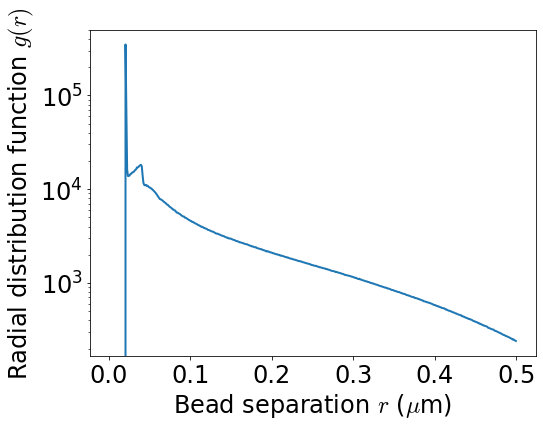

In [13]:
data_path = (ceph_path /"21-05-18_AMchr1_scan.8_loop520_pin/simulations/s2/")
ss_ind = 900
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[0, 520])
    vol = np.pi*(.5**3)/.75
    fig, ax, rad_distr_func, rad_arr = make_rad_distr_func_graph(dist_mat, system_volume=vol)

tmp1 = rad_distr_func[1:]
#plt.yscale("log")



# Test graphs

## Segment distribution

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


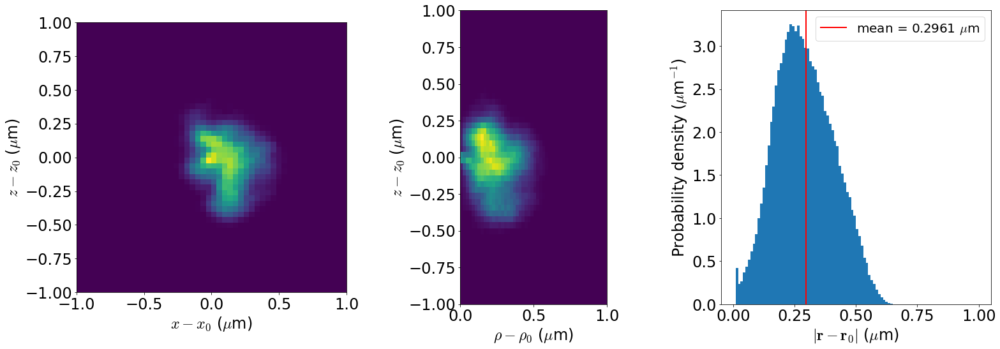

In [14]:
# Testing
data_path = ceph_path / "21-04-23_AMchr1_line512_pin/"
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    sy_dat = h5_data['raw_data']['sylinders'][...]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    _ = aa.make_segment_distr_graphs(com_arr, [], [0,1], 1,2)

## End-to-End Displacement

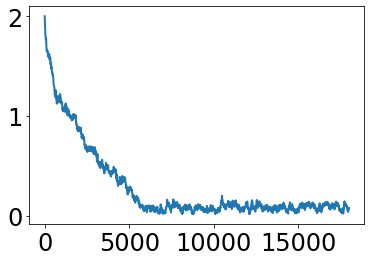

In [15]:
data_path = ceph_path / "21-05-07_AMchr1_line100_scan5.1_xl1000-5000/simulations/xl1000/"
ss_ind = 0
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    ee_dist = aa.get_end_end_distance(com_arr)
    
fig, ax = plt.subplots()
_ = ax.plot(time_arr, ee_dist)

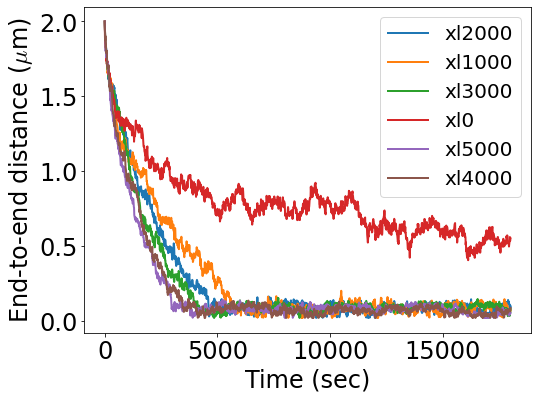

In [16]:
data_path = ceph_path / "21-05-07_AMchr1_line100_scan5.1_xl1000-5000/simulations/"
ss_ind = 0
fig, ax = plt.subplots(figsize=(8,6))
for h5_path in data_path.glob('**/*.h5'):
    with h5py.File(h5_path, 'r+') as h5_data:
        time_arr = h5_data['time'][ss_ind:]
        sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
        com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
        ee_dist = aa.get_end_end_distance(com_arr)
    
    _ = ax.plot(time_arr, ee_dist, label=h5_path.stem)
    
_ = ax.set_xlabel('Time (sec)')
_ = ax.set_ylabel('End-to-end distance ($\mu$m)')
_ = ax.legend()

## Radius of gyration

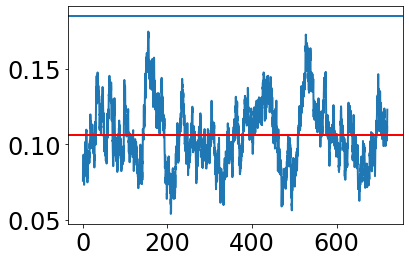

In [17]:
data_path = ceph_path / "21-05-12_AMchr1_RS_line512eq_lo0_kl36.50_visc1.0_ts.1/"

ss_ind = 0
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    rog_arr = aa.calc_rad_of_gyration(com_arr)
    ee_dist = aa.get_end_end_distance(com_arr)

fig, ax = plt.subplots()
_ = ax.plot(time_arr, rog_arr)
_ = ax.axhline(np.sqrt(nbeads*.02*.02/6.))
_ = ax.axhline(np.mean(rog_arr), c='r')
#ax.plot(time_arr, ee_dist)
#plt.axhline(np.mean(rog_arr))

## Nearest neighbors

[181 228 229 230]
[330 283 282 281]


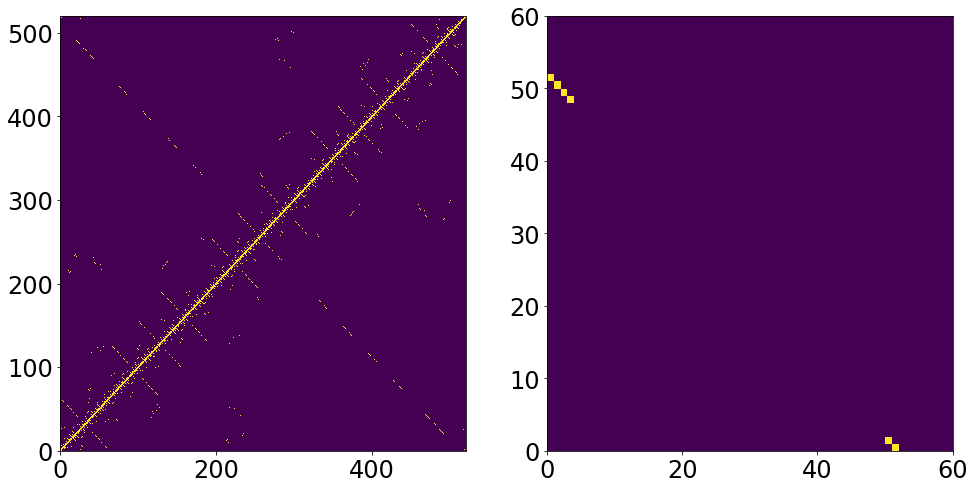

In [18]:
data_path = ceph_path / "21-04-06_AMchr1_loop520_pin_conf.6/"
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    sy_dat = h5_data['raw_data']['sylinders'][...]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    neighbor_mat = aa.find_neighbors(com_arr, .02)
    fig, ax = plt.subplots(1, 2, figsize=(16, 8))
    ax[0].pcolorfast(neighbor_mat)
    start=180
    stop=240
    ax[1].pcolorfast(neighbor_mat[start:stop, -stop:-start])
    x, y = np.where(neighbor_mat)
    x_ind = np.where((x > start) & (x < stop))
    print(x[x_ind][np.where(y[x_ind] > 520-stop)])
    print(y[x_ind][np.where(y[x_ind] > 520-stop)])
    #print(np.where(neighbor_mat))
    

# 200 looptail analysis

## 200 looptail

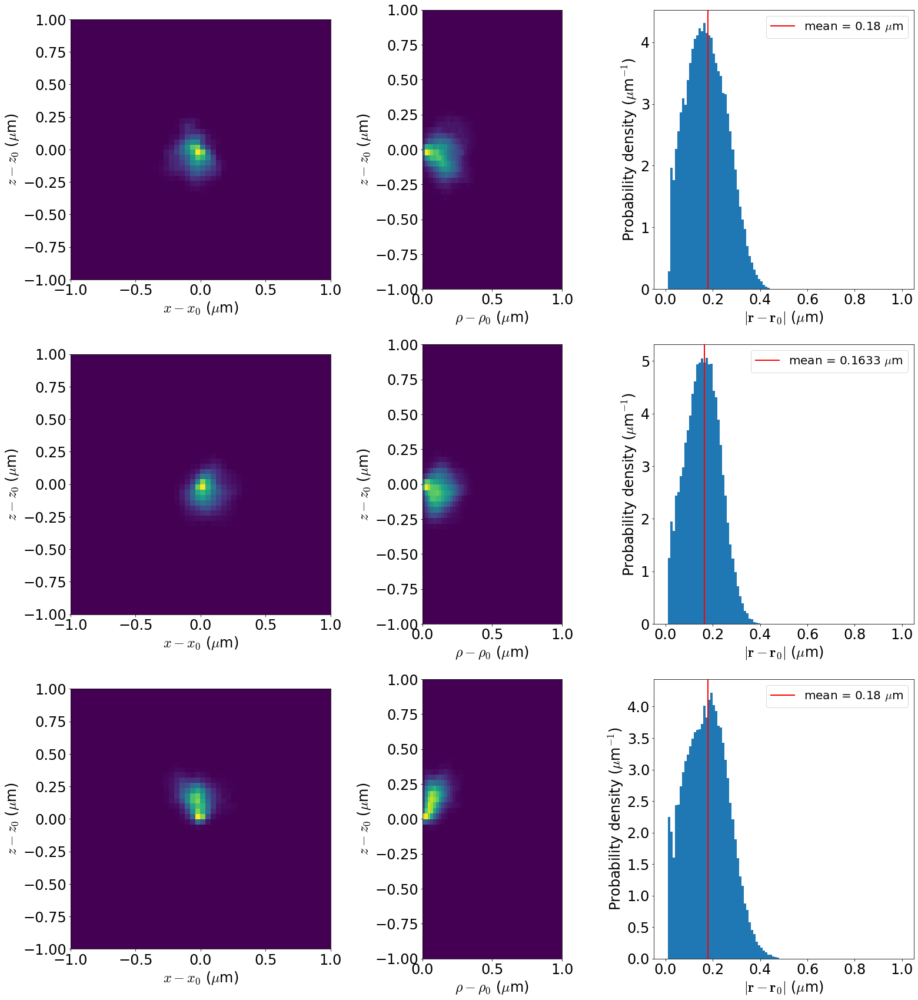

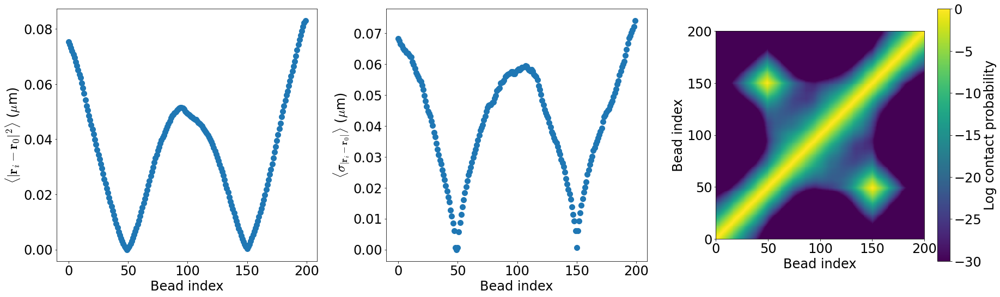

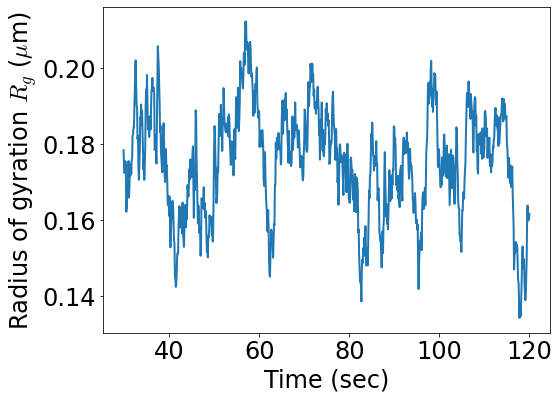

In [25]:
data_path = (ws_path /"21-07-30_AMchr1_looptail200")
ss_ind = 300
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=49, hist_max=1.)
fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 200 looptail rigid 4links

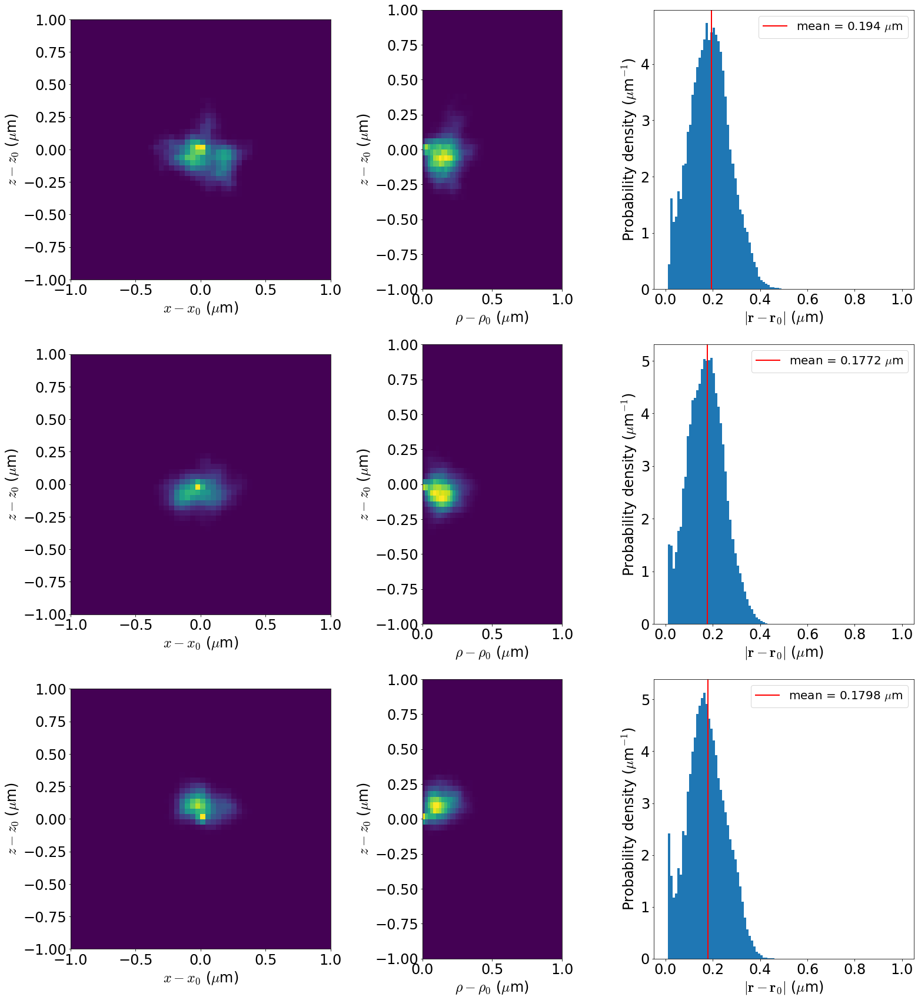

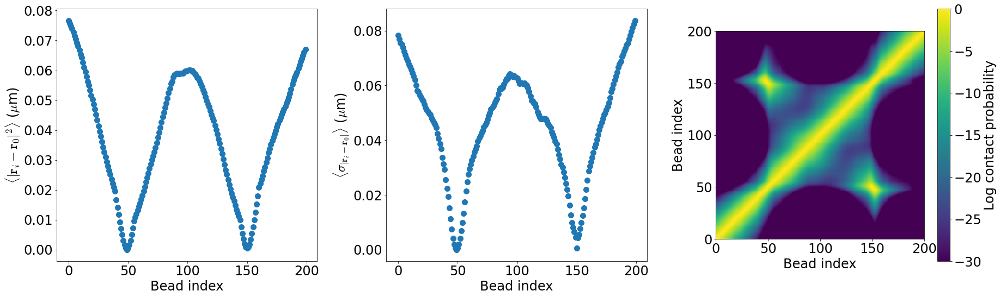

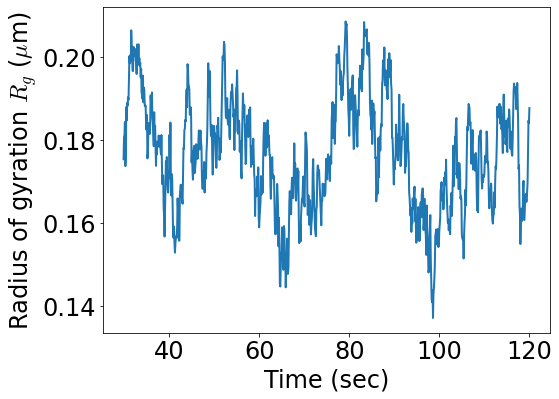

In [24]:
data_path = (ws_path /"21-07-30_AMchr1_looptail200_rigid_4links")
ss_ind = 300
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=49, hist_max=1.)
fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 200 looptail rigid

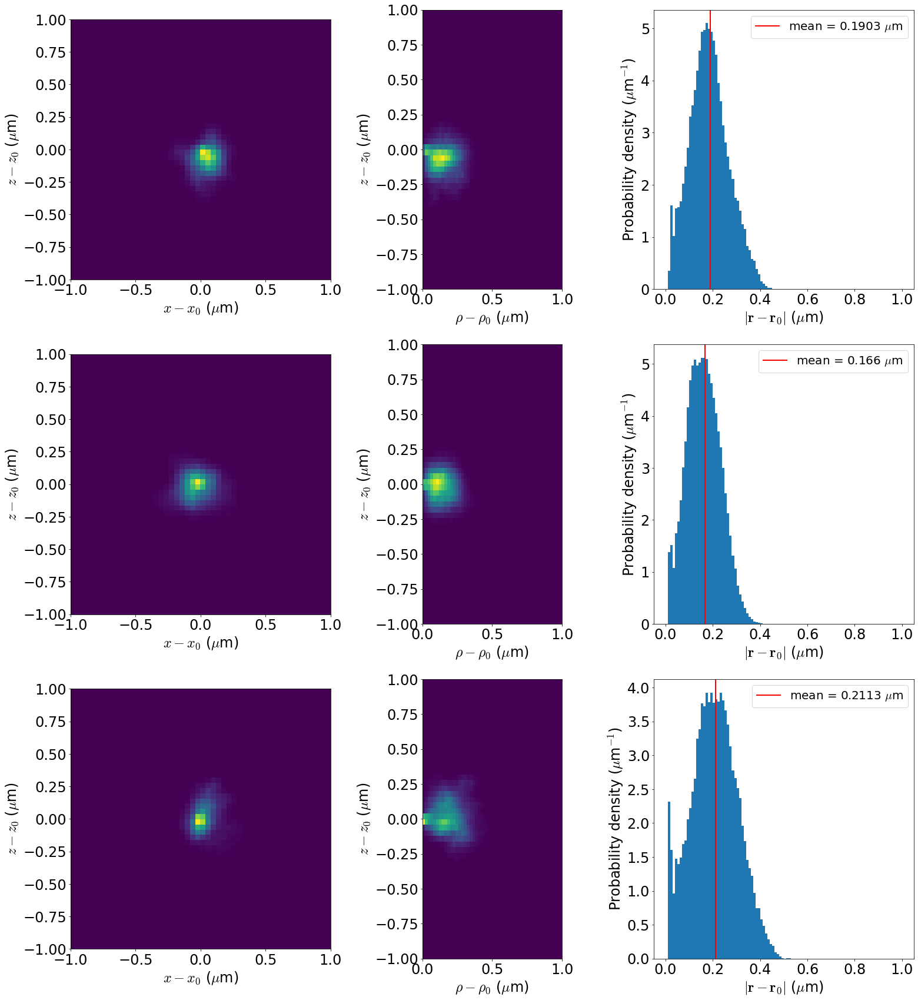

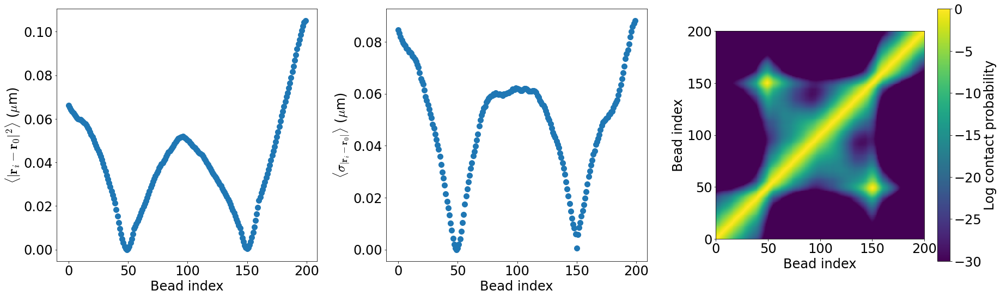

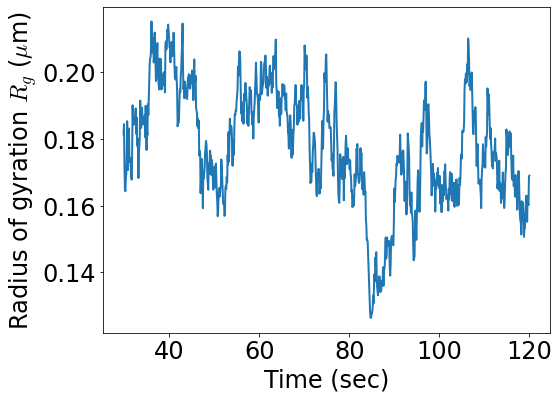

In [26]:
data_path = (ws_path /"21-07-30_AMchr1_looptail200_rigid_center")
ss_ind = 300
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=49, hist_max=1.)
fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 200 looptail 4links

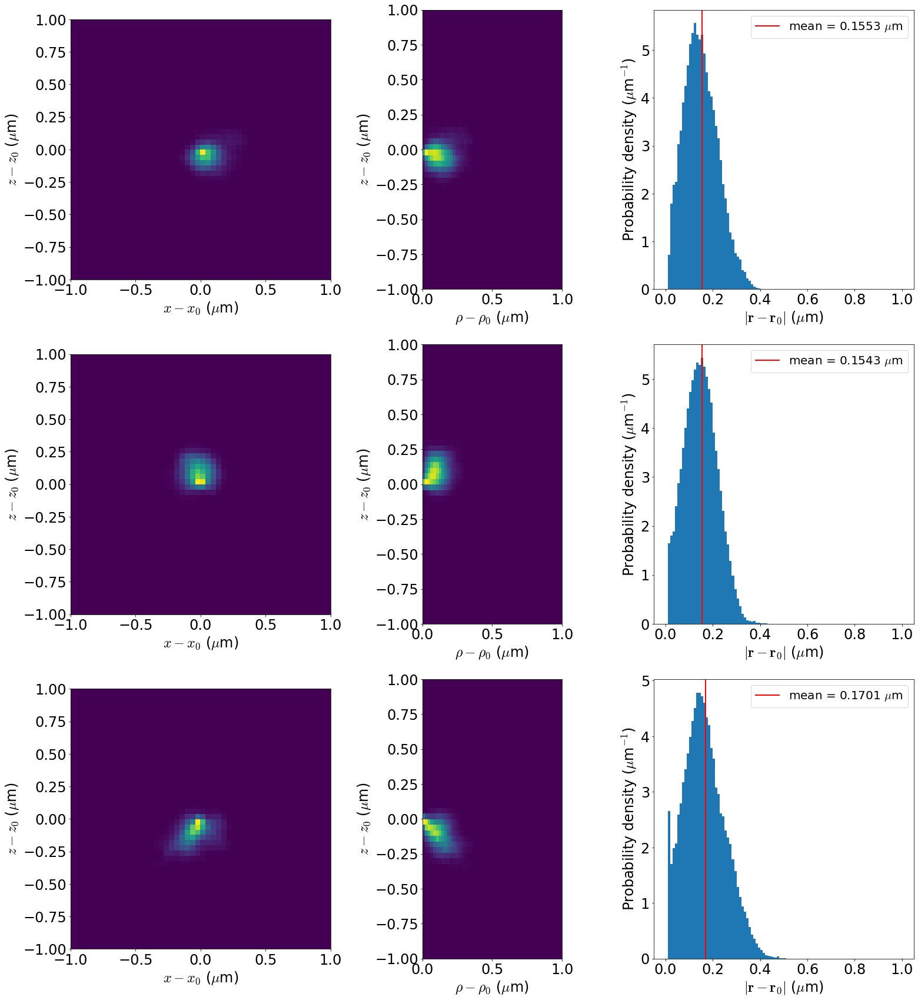

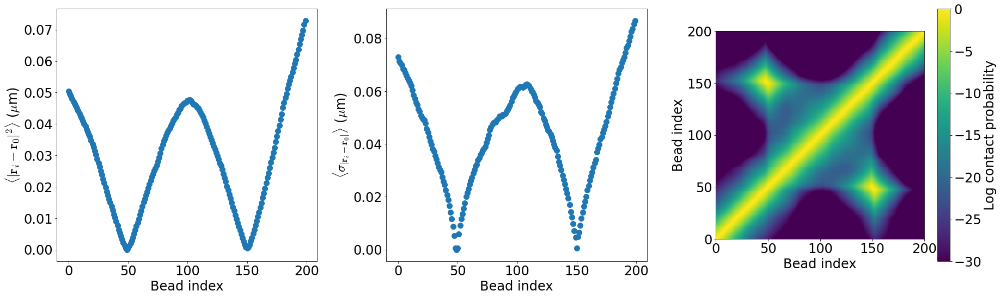

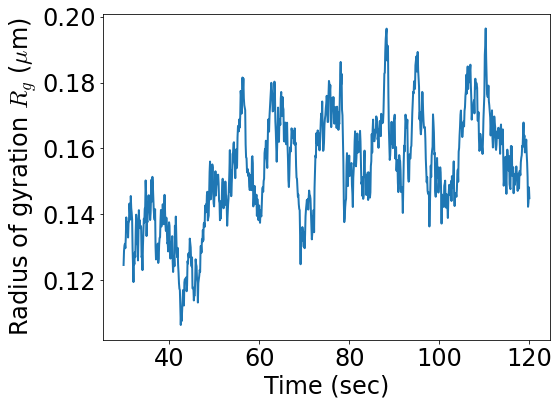

In [28]:
data_path = (ws_path /"21-07-30_AMchr1_looptail200_4links")
ss_ind = 300
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=49, hist_max=1.)
fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 200 looptail 2links

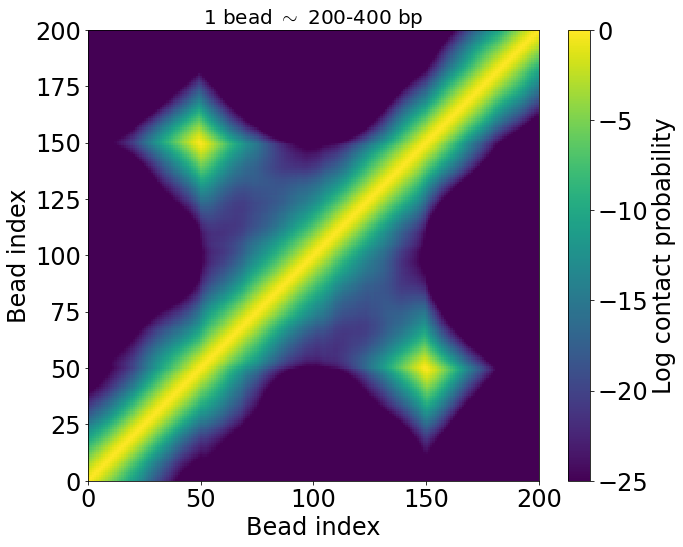

In [213]:
data_path = (ws_path /"21-08-09_AMchr1_looptail200_2links")
ss_ind = 300
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=49, hist_max=1.)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 200 looptail rigid 2links

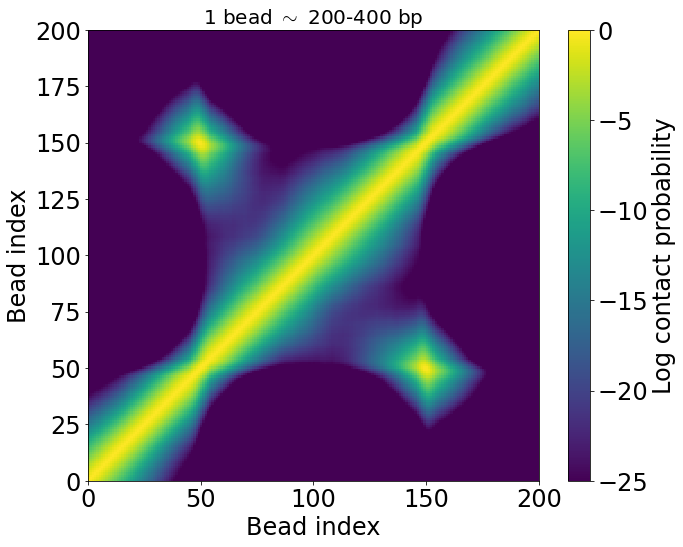

In [26]:
data_path = (ceph_path /"21-08-09_AMchr1_looptail200_rigid_2links")
ss_ind = 300
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=49, hist_max=1.)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 200 looptail 2Xrigid 2links

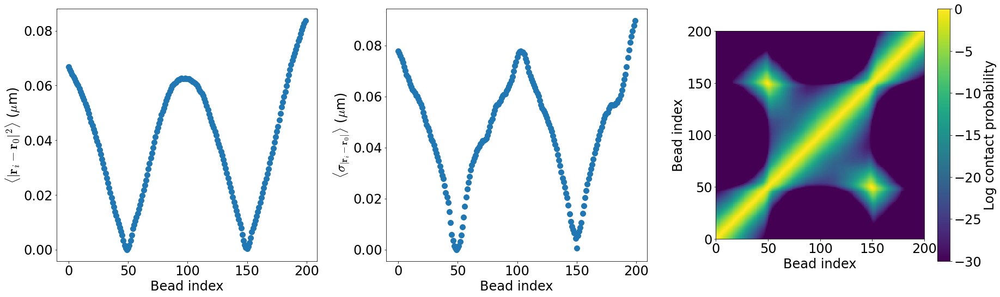

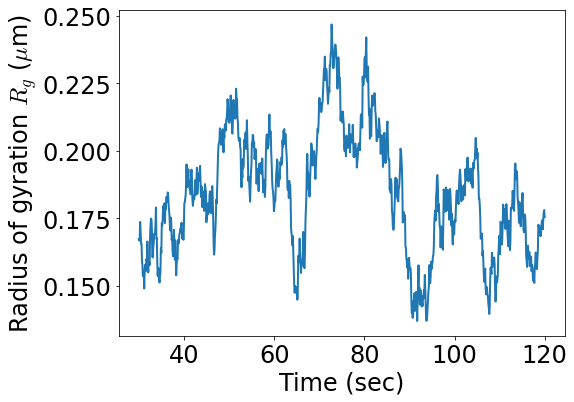

In [41]:
data_path = (ws_path /"21-08-09_AMchr1_looptail200_2Xrigid_2links")
ss_ind = 300
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=49, hist_max=1.)
fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 200 looptail extend rigid 2links

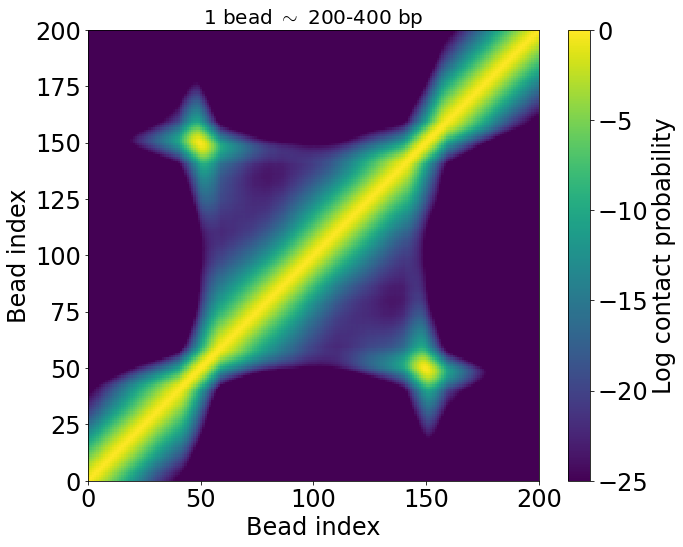

In [212]:
data_path = (ws_path /"21-08-09_AMchr1_looptail200_extrigid_2links")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=49, hist_max=1.)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 200 back-looptail 

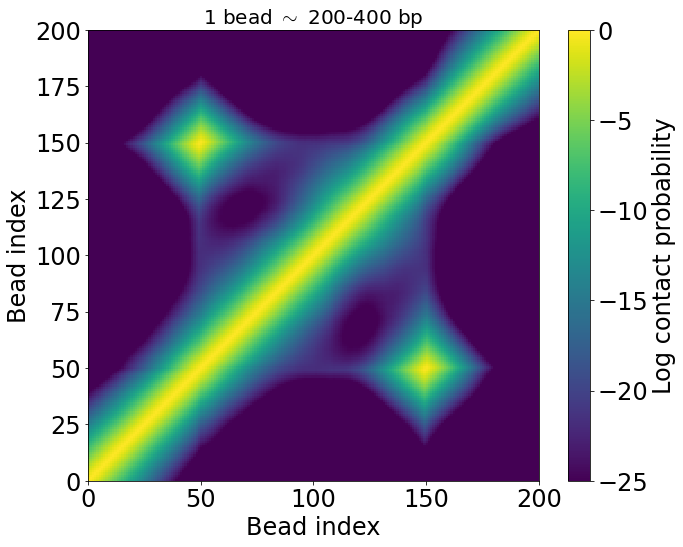

In [210]:
data_path = (ws_path /"21-08-11_aLchr1_Blooptail200")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 200 back-looptail rigid 

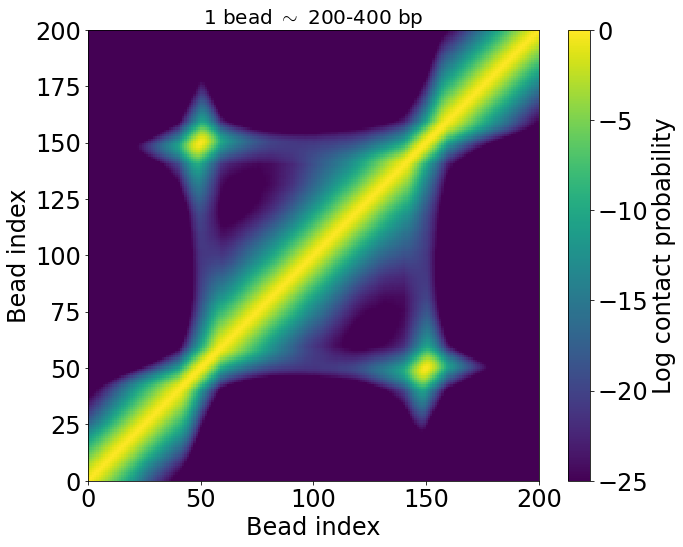

In [211]:
data_path = (ws_path /"21-08-11_aLchr1_Blooptail200_rigid")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=49, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)


#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 200 line rigid

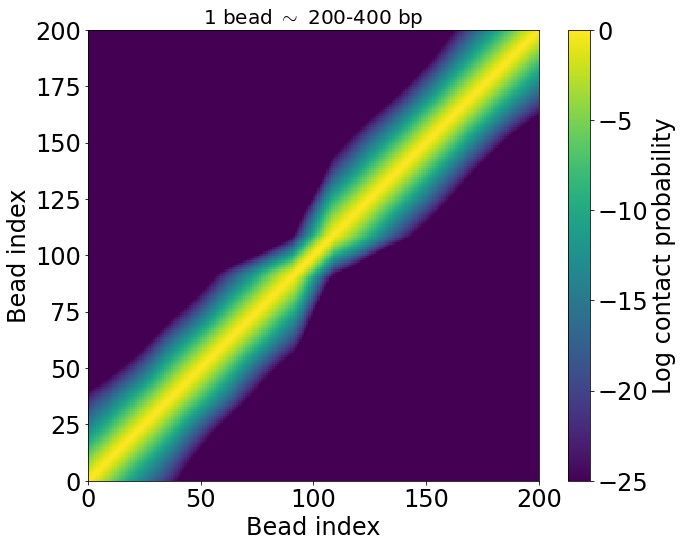

In [45]:
data_path = (ws_path /"21-09-08_aLchr1_line200_rigid")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=49, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)


#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 200 line rigid 40

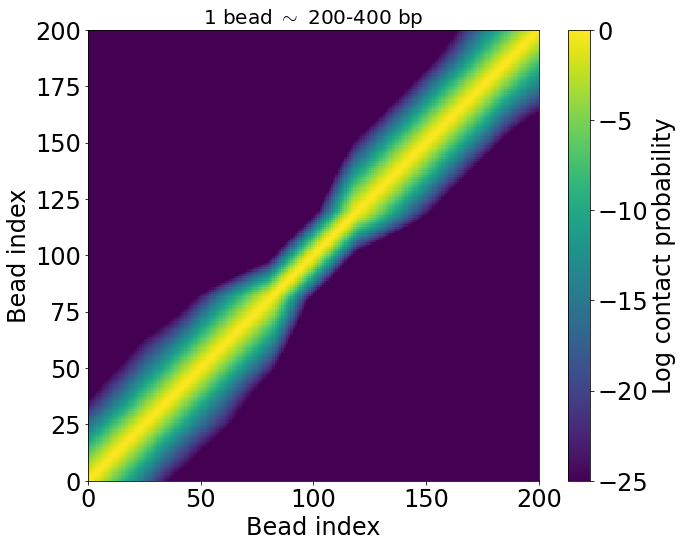

In [47]:
data_path = (ws_path /"21-09-09_aLchr1_line200_rigid40")
ss_ind = 300
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=49, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)


#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

# 500 bead looptails (aLENS)

## 500 looptail

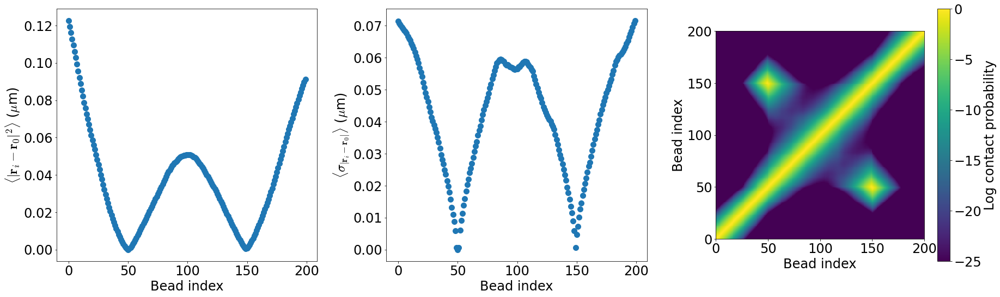

In [170]:
data_path = (ws_path /"21-08-09_AMchr1_looptail500_2links")
ss_ind = 900
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:350,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [199,], [49,150], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 500 looptail rigid (redo with longer rigidity)

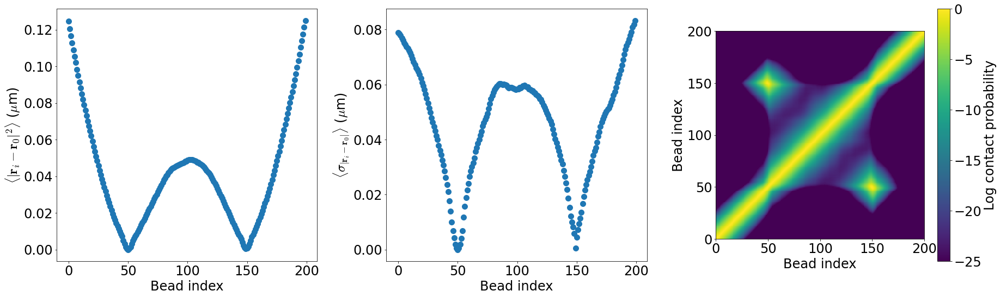

In [197]:
data_path = (ws_path /"21-08-09_AMchr1_looptail500_rigid_2links")
ss_ind = 900
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:350,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [199,], [49,150], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-10_aLchr1_3looptail500

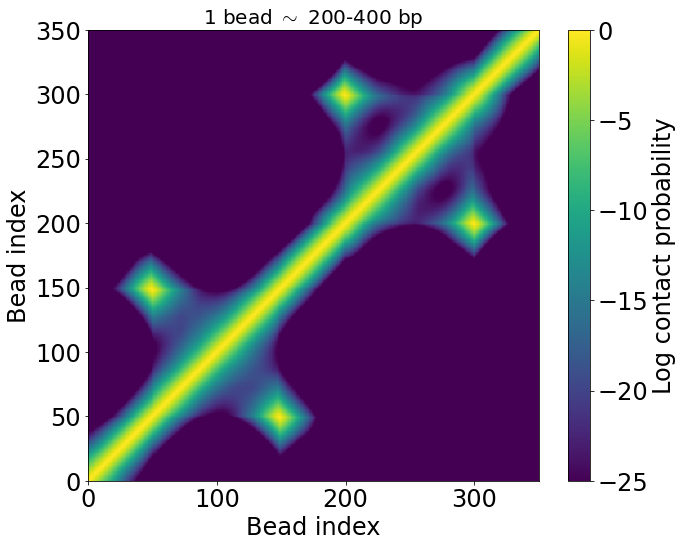

In [228]:
data_path = (ws_path /"21-08-10_aLchr1_3looptail500")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:350,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-10_aLchr1_3looptail500_rigid

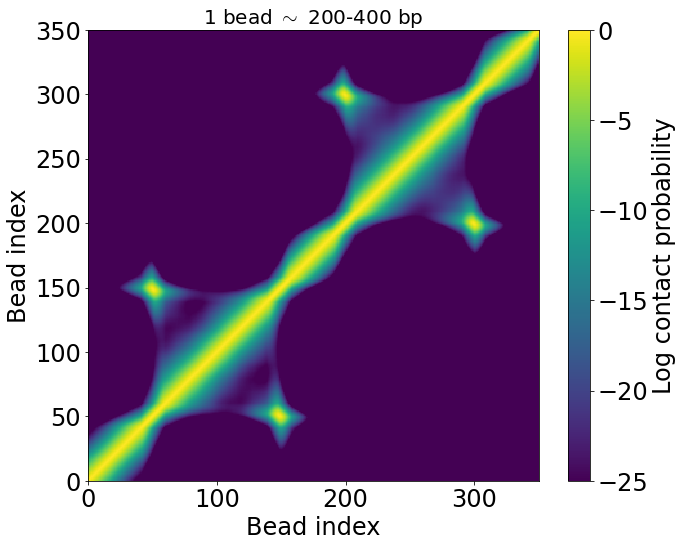

In [227]:
data_path = (ws_path /"21-08-10_aLchr1_3looptail500_rigid")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:350,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-10_aLchr1_3looptail500_conf

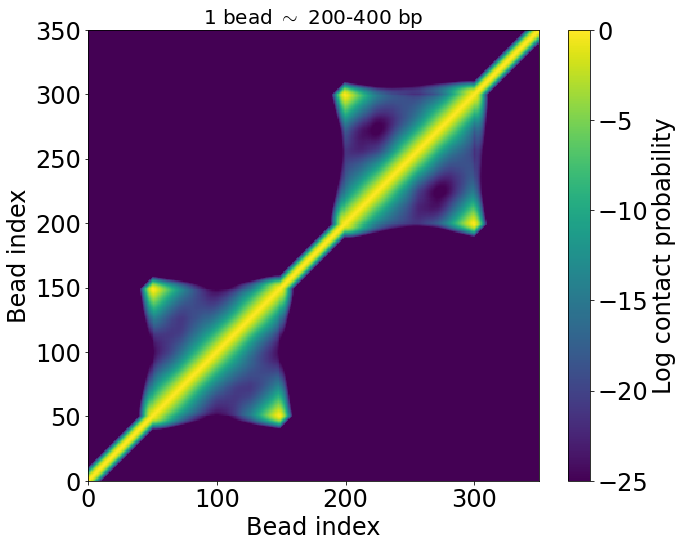

In [229]:
data_path = (ws_path /"21-08-10_aLchr1_3looptail500_conf")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:350,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-10_aLchr1_3looptail500_rigid_conf

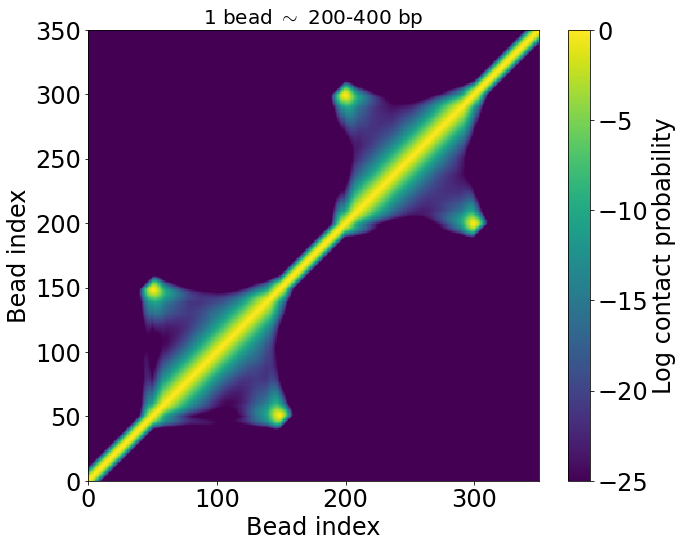

In [231]:
data_path = (ws_path /"21-08-10_aLchr1_3looptail500_rigid_conf")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:350,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)


#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-12_aLchr1_2looptail500_rigid

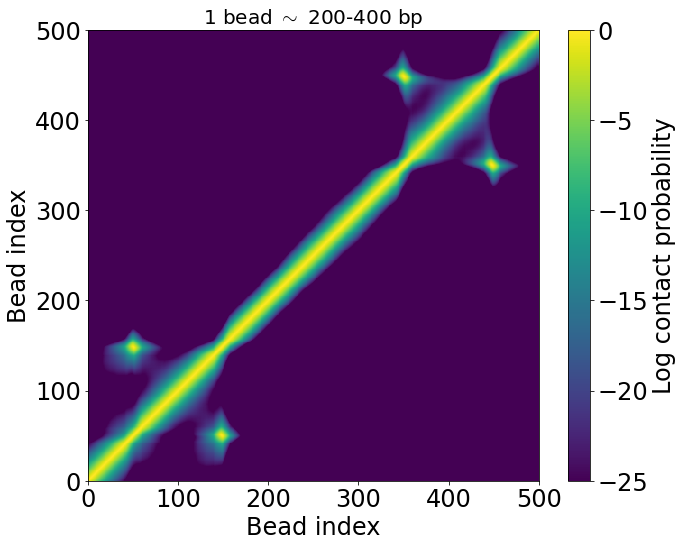

In [217]:
data_path = (ws_path /"21-08-12_aLchr1_2looptail500_rigid")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-13_aLchr1_looptail500_hairpin10_bot

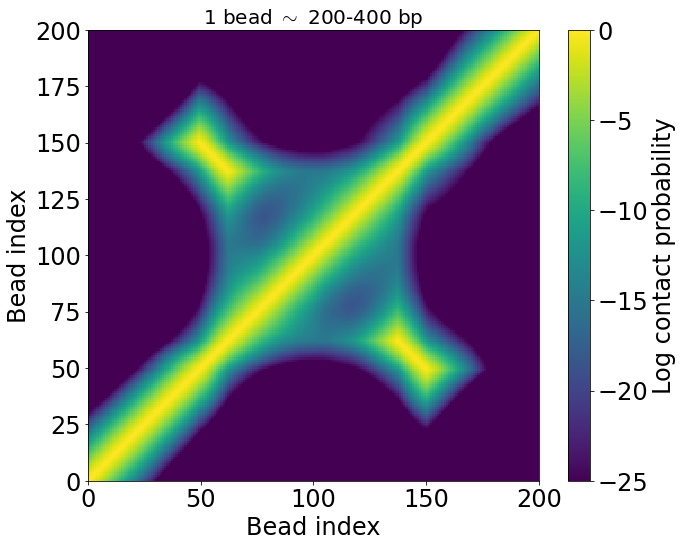

In [218]:
data_path = (ws_path /"21-08-13_aLchr1_looptail500_hairpin10_bot")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:350,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-13_aLchr1_looptail500_hairpin10_mid

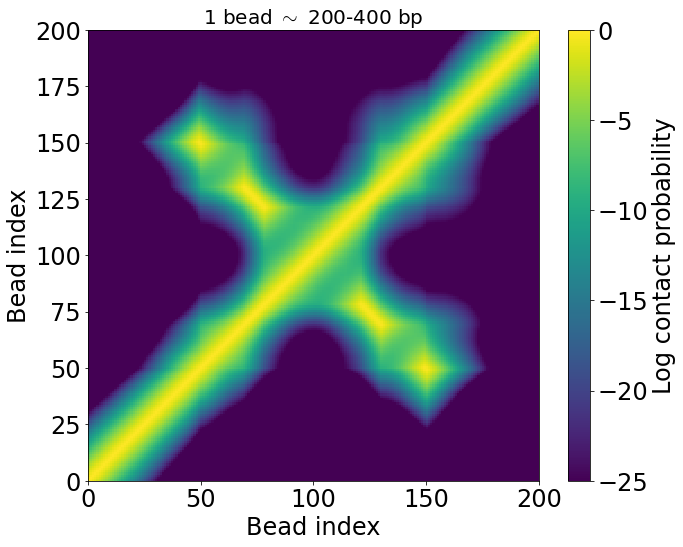

In [219]:
data_path = (ws_path /"21-08-13_aLchr1_looptail500_hairpin10_mid")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:350,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-13_aLchr1_looptail500_hairpin10_top

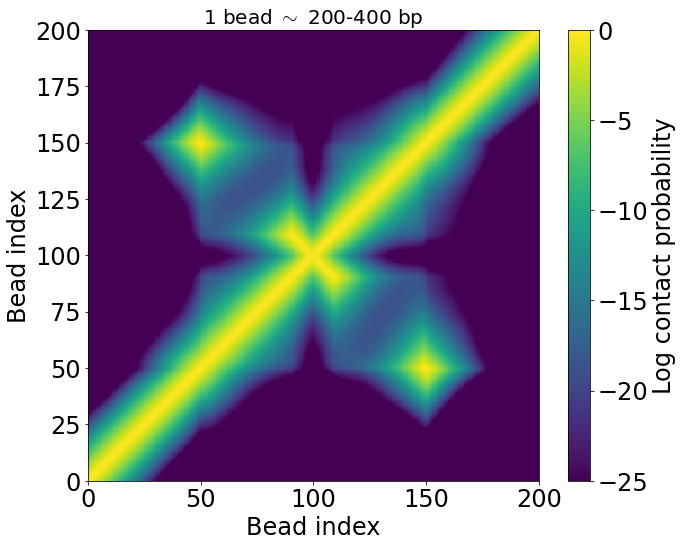

In [220]:
data_path = (ws_path /"21-08-13_aLchr1_looptail500_hairpin10_top")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:350,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-17_aLchr1_looptail500_3base

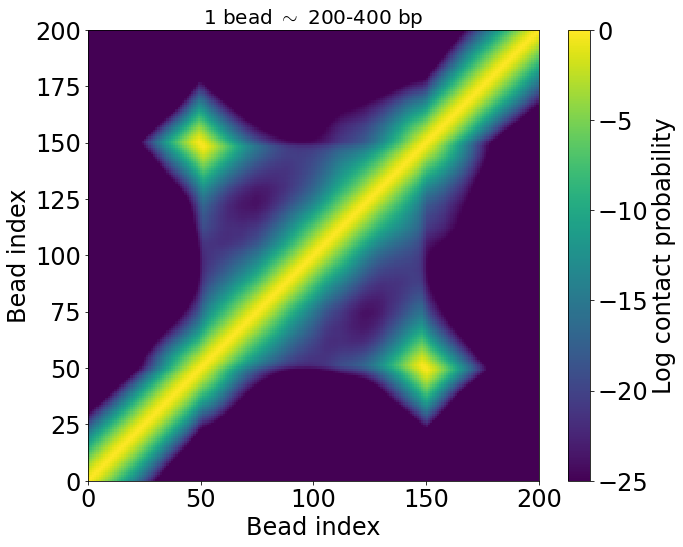

In [221]:
data_path = (ws_path /"21-08-17_aLchr1_looptail500_3base")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:350,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-17_aLchr1_looptail500_3base_rigid

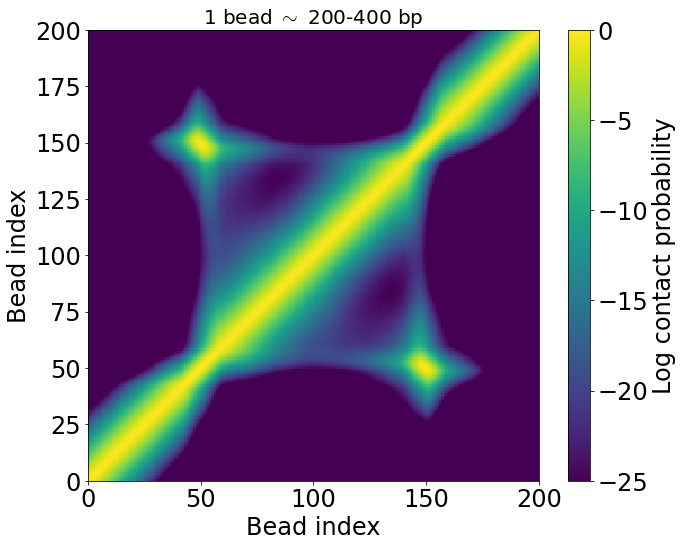

In [222]:
data_path = (ws_path /"21-08-17_aLchr1_looptail500_3base_rigid")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:350,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-17_aLchr1_Blooptail500_3base

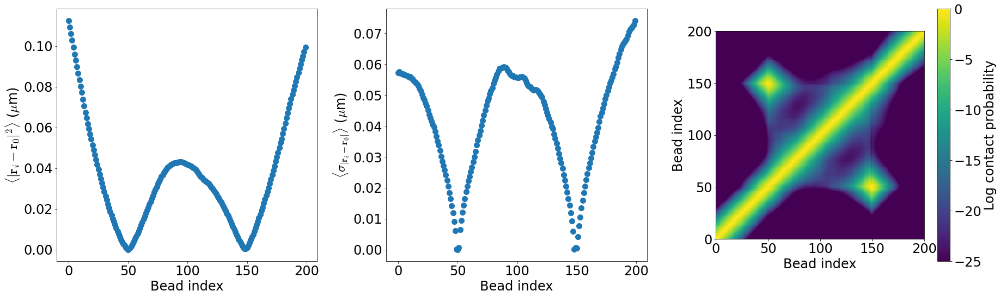

In [171]:
data_path = (ws_path /"21-08-17_aLchr1_Blooptail500_3base")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:350,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-17_aLchr1_Blooptail500_3base_rigid (redo)

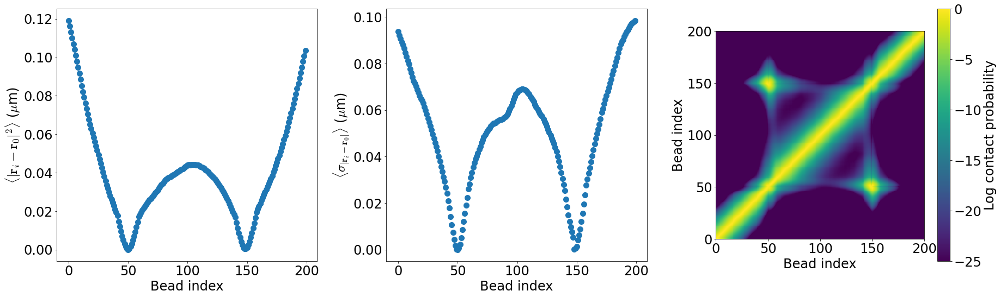

In [174]:
data_path = (ws_path /"21-08-17_aLchr1_Blooptail500_3base_rigid")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:350,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

# 700 bead looptails (aLENS)

## 21-08-11_aLchr1_looptail700

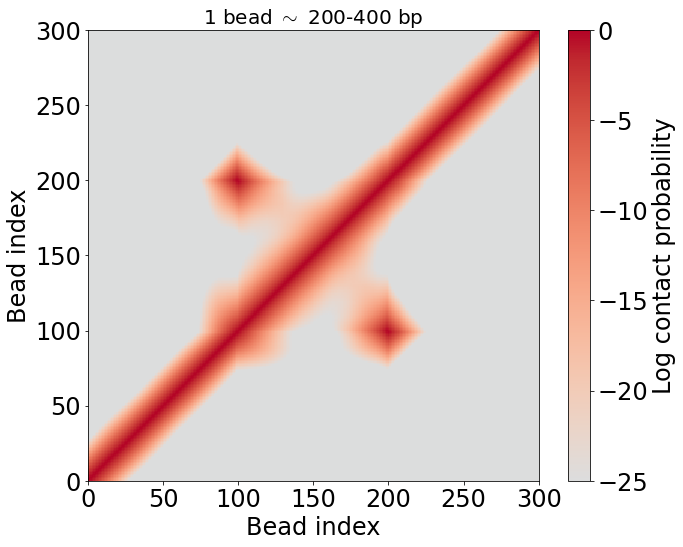

In [46]:
data_path = (ws_path /"21-08-11_aLchr1_looptail700")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][200:500,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1.)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-11_aLchr1_looptail700_conf

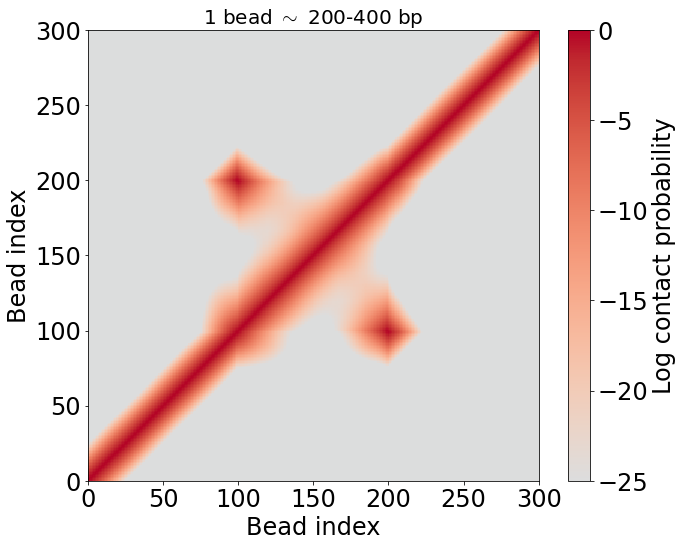

In [47]:
data_path = (ws_path /"21-08-11_aLchr1_looptail700_conf")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][200:500,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-12_aLchr1_looptail700_rigid

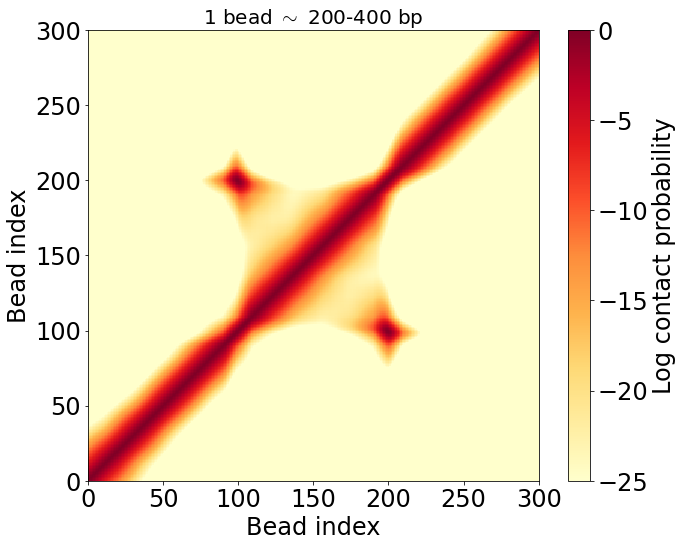

In [55]:
data_path = (ws_path /"21-08-12_aLchr1_looptail700_rigid")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][200:500,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-13_aLchr1_2-1looptail700_fig4B

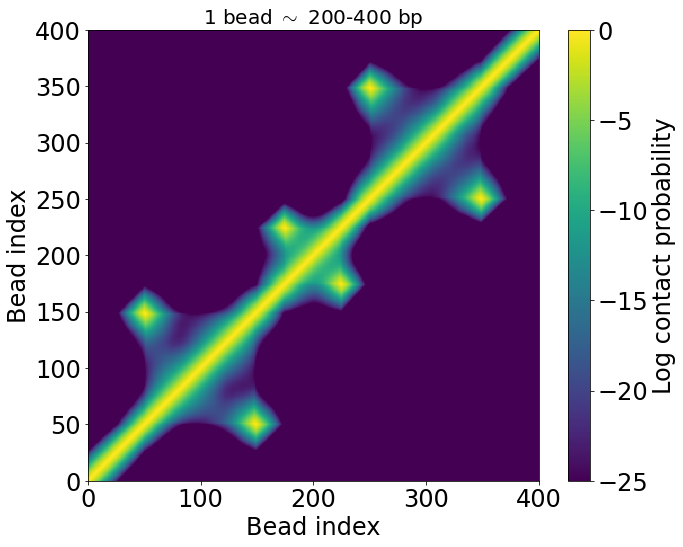

In [244]:
data_path = (ws_path /"21-08-13_aLchr1_2-1looptail700_fig4B")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-13_aLchr1_2-1looptail700_fig4B_rigid1

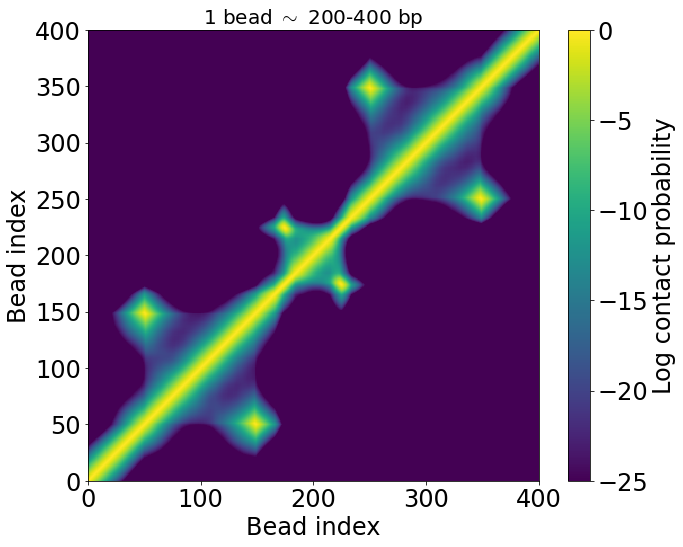

In [245]:
data_path = (ws_path /"21-08-13_aLchr1_2-1looptail700_fig4B_rigid1")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-16_aLchr1_3looptail700

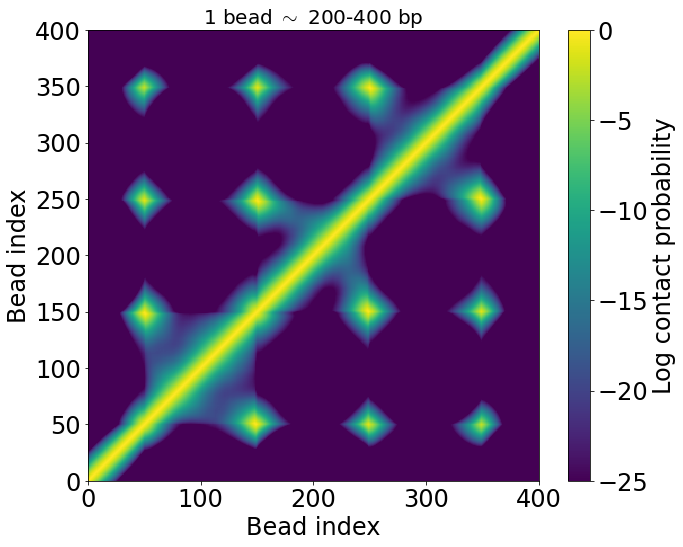

In [234]:
data_path = (ws_path /"21-08-16_aLchr1_3looptail700")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-17_aLchr1_3looptail700_rigid

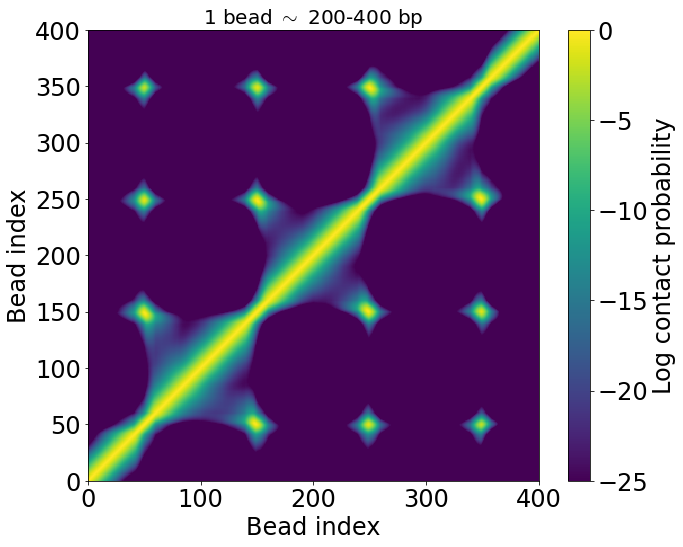

In [237]:
data_path = (ws_path /"21-08-17_aLchr1_3looptail700_rigid")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-17_aLchr1_3Blooptail700

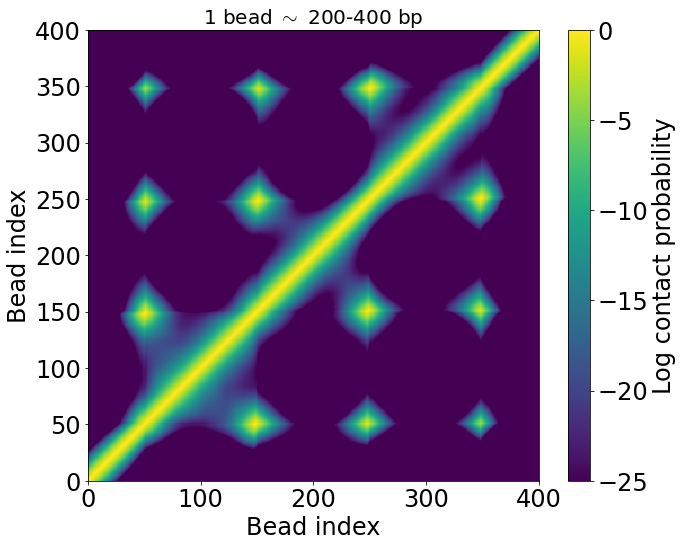

In [235]:
data_path = (ws_path /"21-08-17_aLchr1_3Blooptail700")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)


#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-17_aLchr1_3Blooptail700_rigid

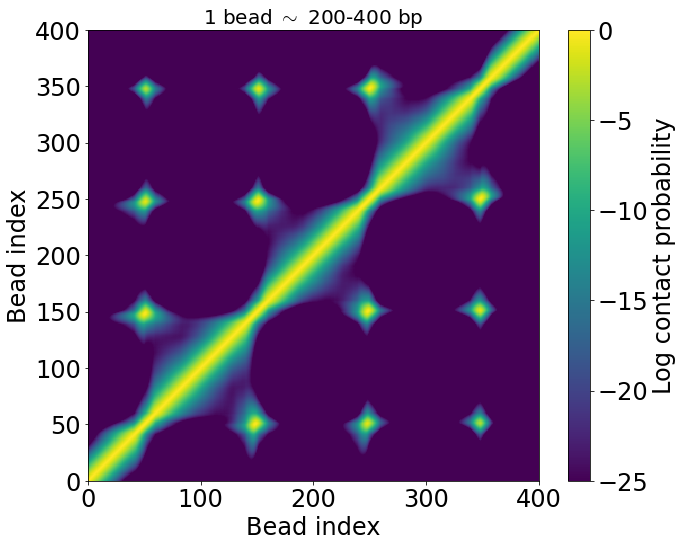

In [236]:
data_path = (ws_path /"21-08-17_aLchr1_3Blooptail700_rigid")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-17_aLchr1_2looptail700

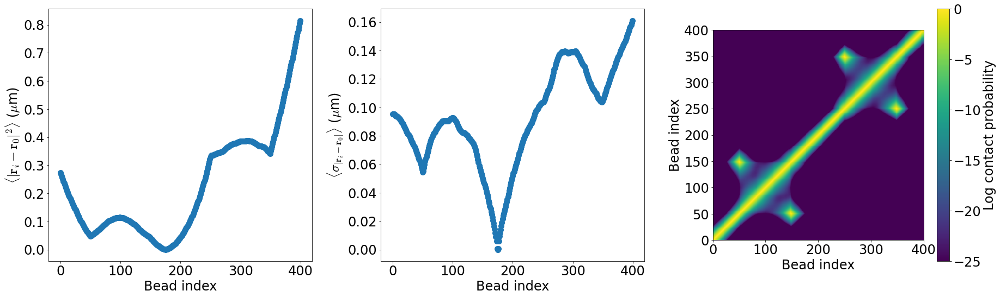

In [152]:
data_path = (ws_path /"21-08-17_aLchr1_2looptail700")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=175, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-17_aLchr1_2looptail700_rigid

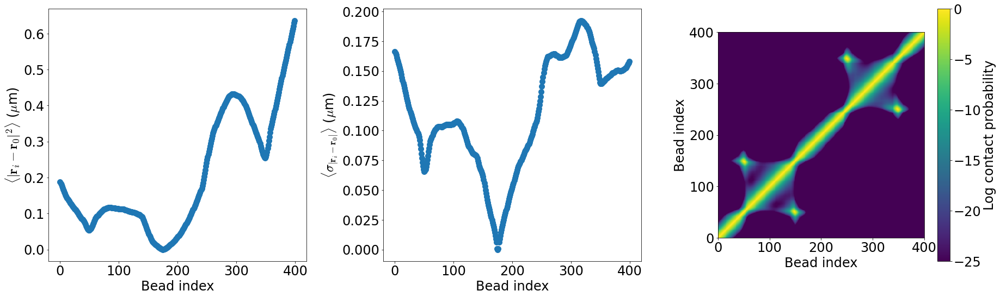

In [154]:
data_path = (ws_path /"21-08-17_aLchr1_2looptail700_rigid")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=175, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-17_aLchr1_2Blooptail700

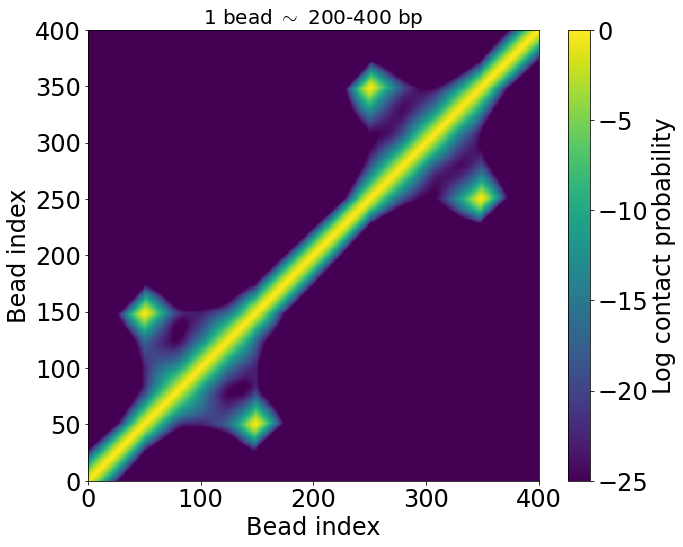

In [242]:
data_path = (ws_path /"21-08-17_aLchr1_2Blooptail700")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-17_aLchr1_2Blooptail700_rigid

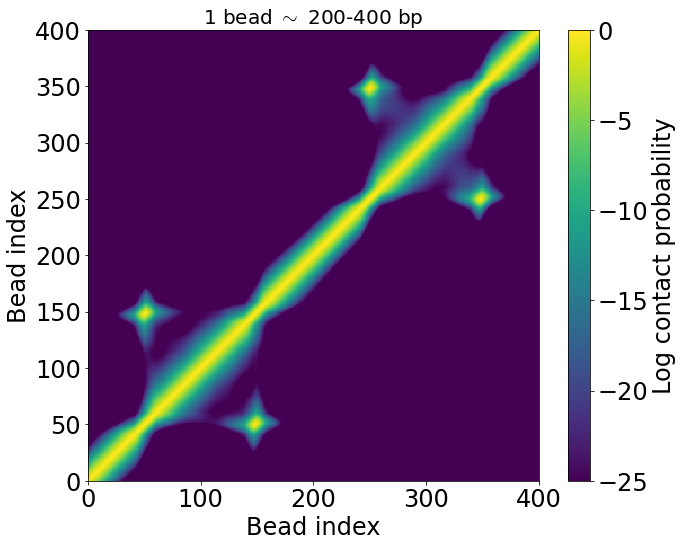

In [243]:
data_path = (ws_path /"21-08-17_aLchr1_2Blooptail700_rigid")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-26_aLchr1_looptail700_hydro

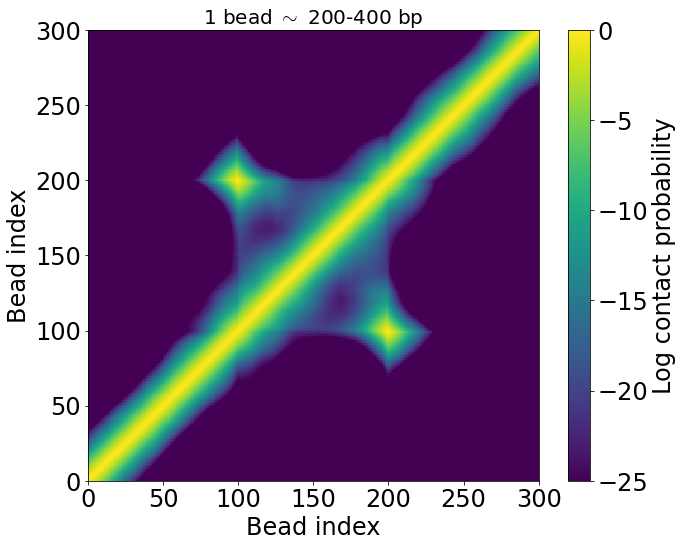

In [27]:
data_path = (ws_path /"21-08-26_aLchr1_looptail700_hydro")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][200:500,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-01_aLchr1_looptail700_rigid_hydro

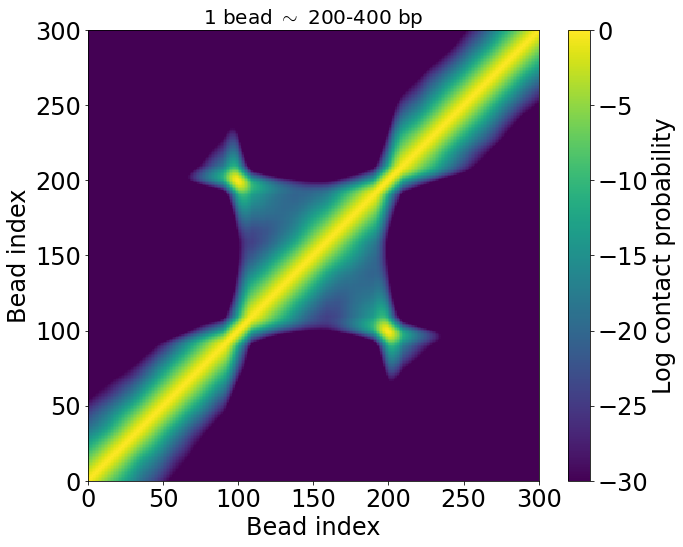

In [26]:
data_path = (ws_path /"21-09-01_aLchr1_looptail700_rigid_hydro")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][200:500,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-30)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-08_aLchr1_Dlooptail700_rigid

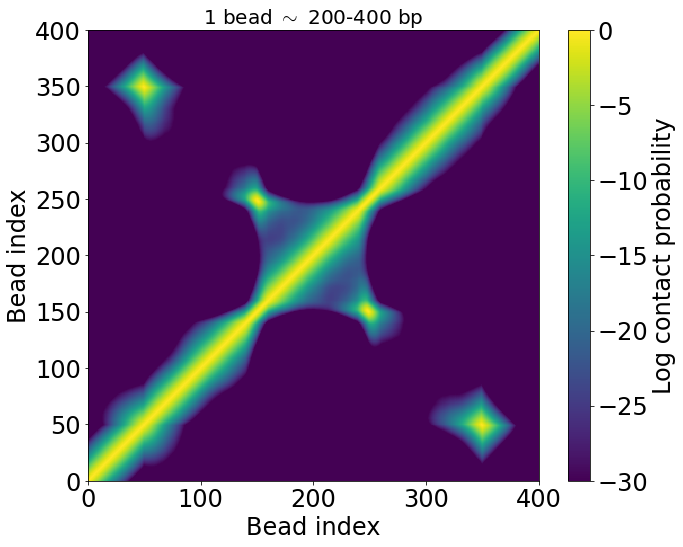

In [43]:
data_path = (ws_path /"21-09-08_aLchr1_Dlooptail700_rigid")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-30)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-09_aLchr1_Dlooptail700

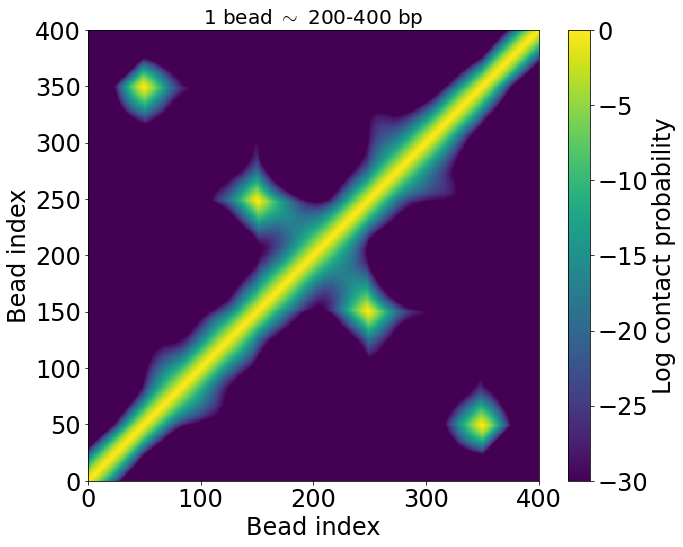

In [48]:
data_path = (ws_path /"21-09-09_aLchr1_Dlooptail700")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-30)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-09_aLchr1_Dlooptail700_conf

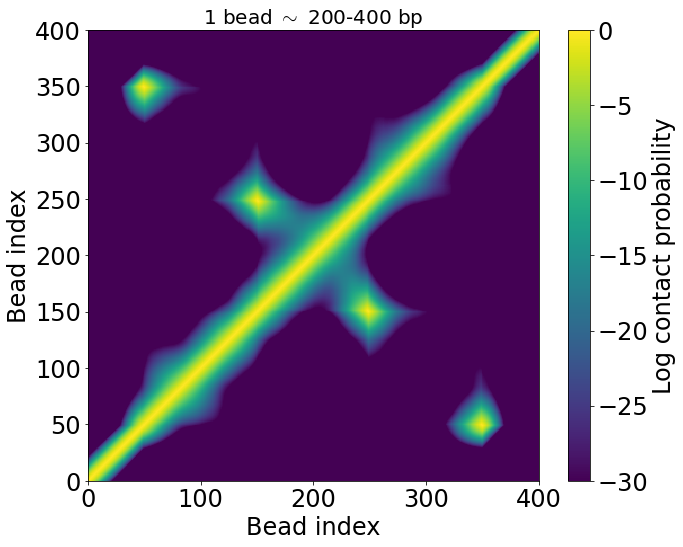

In [49]:
data_path = (ws_path /"21-09-09_aLchr1_Dlooptail700_conf")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-30)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-09_aLchr1_Dlooptail700_hydro

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


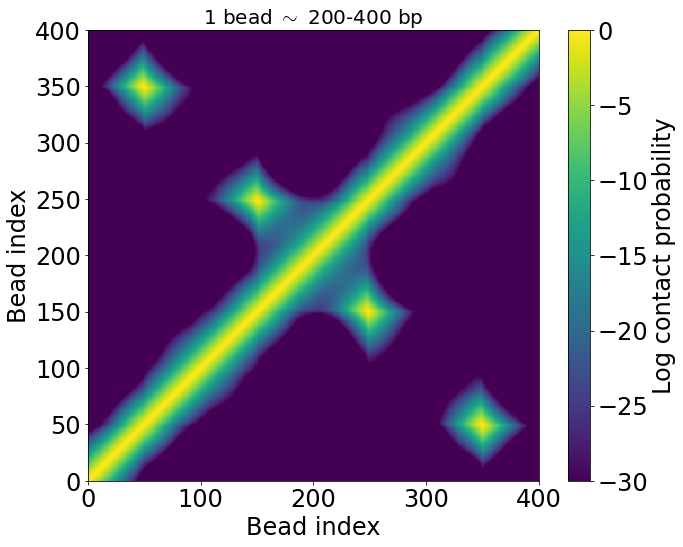

In [15]:
data_path = (ws_path /"21-09-09_aLchr1_Dlooptail700_hydro")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-30)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-09_aLchr1_Dlooptail700_rigid_conf

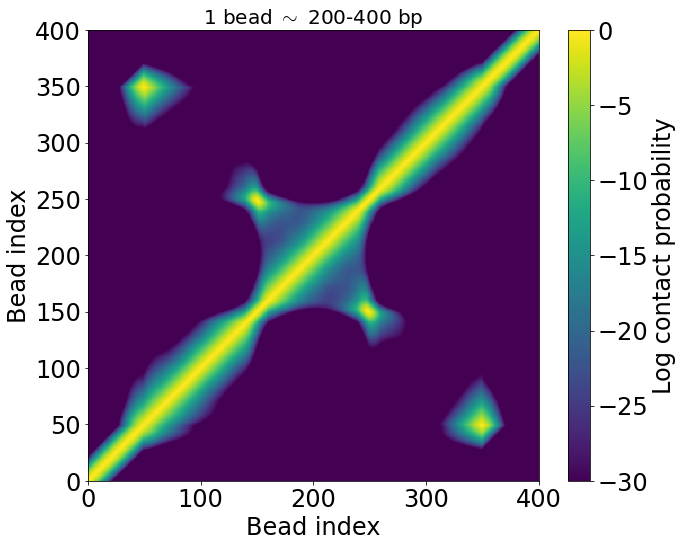

In [54]:
data_path = (ws_path /"21-09-09_aLchr1_Dlooptail700_rigid_conf")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-30)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-09_aLchr1_Dlooptail700_rigid_hydro

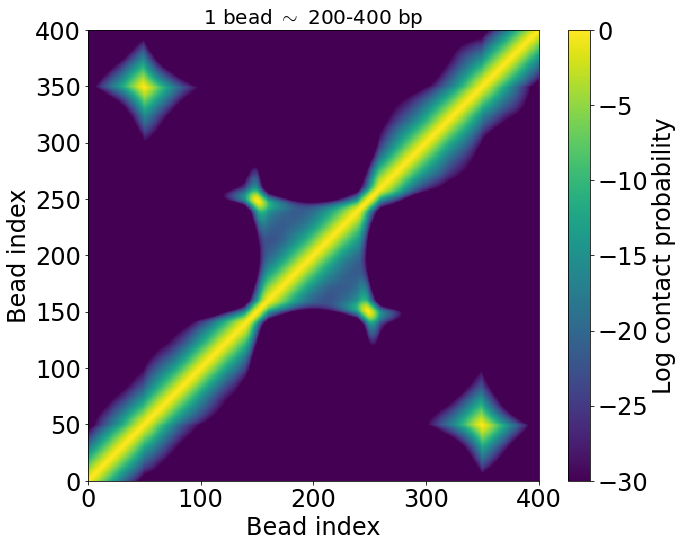

In [16]:
data_path = (ws_path /"21-09-09_aLchr1_Dlooptail700_rigid_hydro")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:550,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-30)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-09_aLchr1_line700_sticky_conf (Need to fix bug)

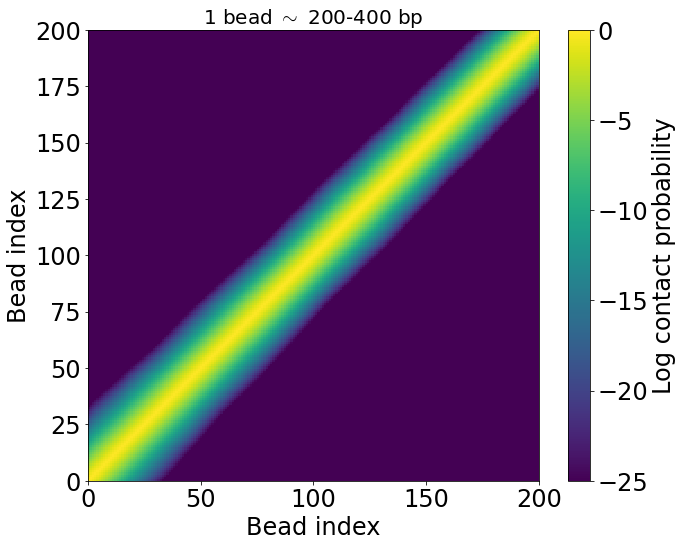

In [24]:
data_path = (ws_path /"21-09-09_aLchr1_line700_sticky_conf")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:350,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-09_aLchr1_LEF700eq_conf_rigid

300


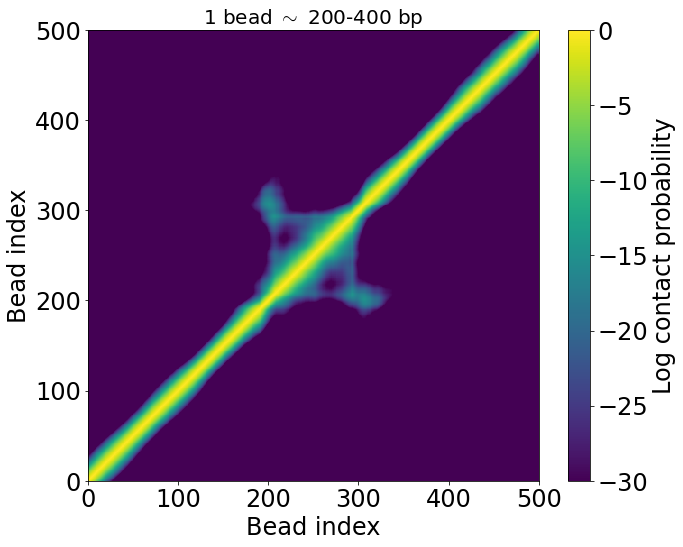

In [95]:
data_path = (ws_path /"21-09-09_aLchr1_slow_LEF700eq_conf_rigid")
ss_ind = 200
end_ind = 500
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][100:600,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-30)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-09_aLchr1_slow_LEF700eq_conf_rigid

300


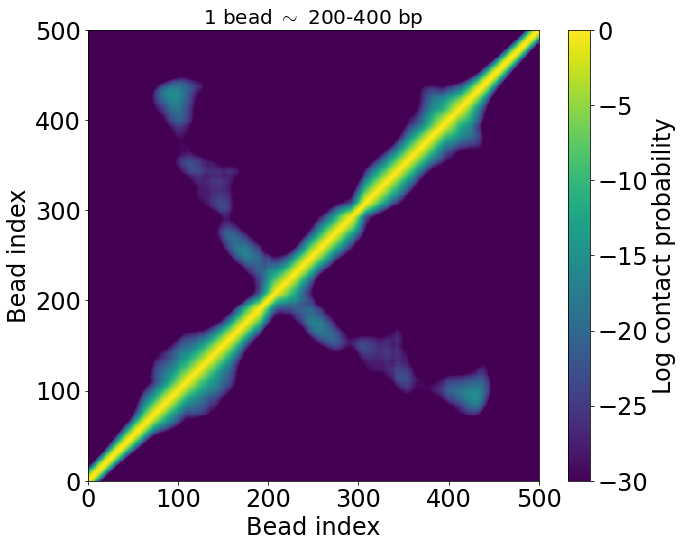

In [98]:
data_path = (ws_path /"21-09-09_aLchr1_slow_LEF700eq_conf_rigid")
ss_ind = 700
end_ind = 1000
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][100:600,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-30)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-15_aLchr1_looptail700_ABasym_rigid

2401


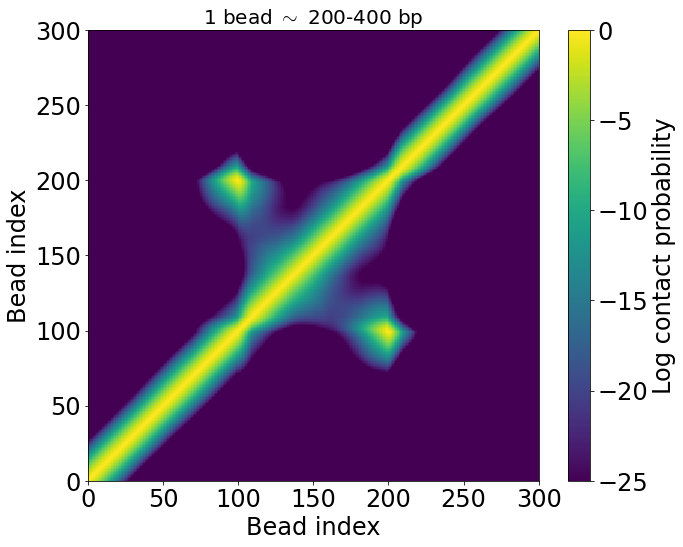

In [26]:
data_path = (ws_path /"21-09-15_aLchr1_looptail700_ABasym_rigid")
ss_ind = 600
end_ind = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][200:500,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-15_aLchr1_looptail700_BAasym_rigid

2401


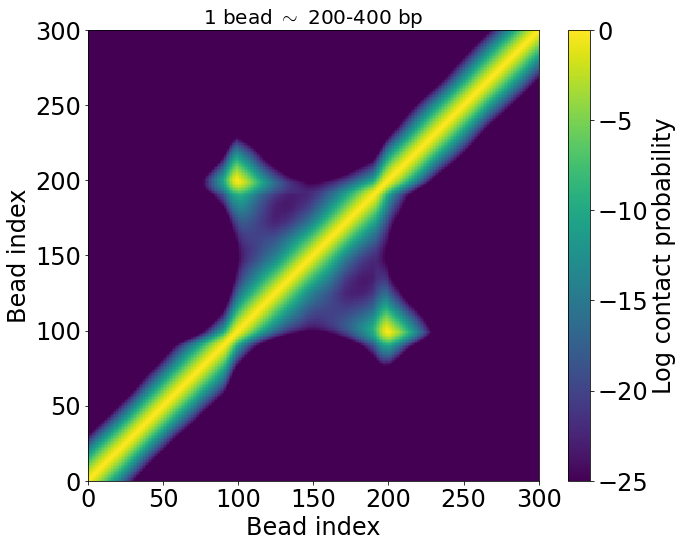

In [27]:
data_path = (ws_path /"21-09-15_aLchr1_looptail700_BAasym_rigid")
ss_ind = 600
end_ind = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][200:500,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-15_aLchr1_looptail700_Lasym_rigid

2401


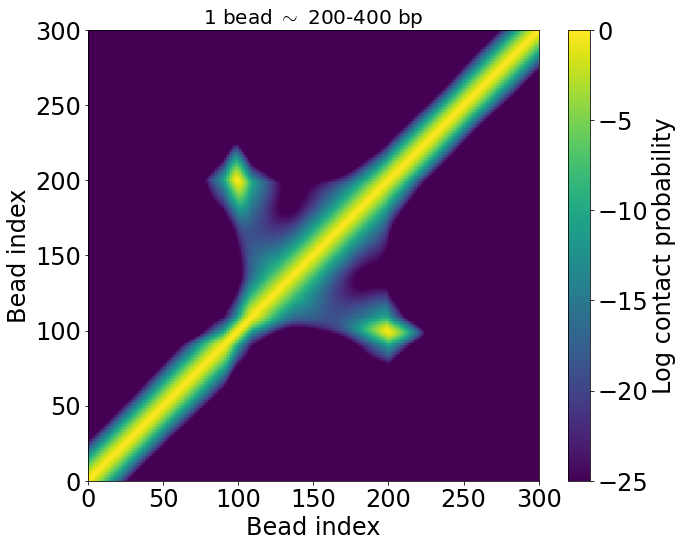

In [33]:
data_path = (ws_path /"21-09-15_aLchr1_looptail700_Lasym_rigid")
ss_ind = 600
end_ind = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][200:500,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-16_aLchr1_looptail700_AAasym_rigid

2401


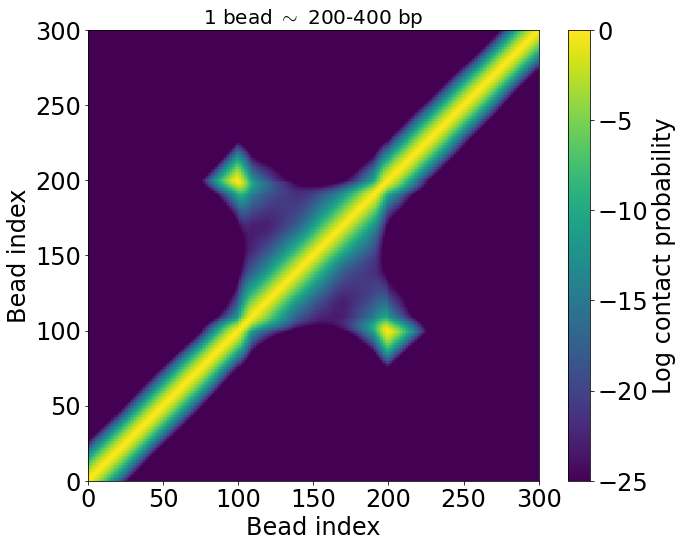

In [36]:
data_path = (ws_path /"21-09-16_aLchr1_looptail700_AAasym_rigid")
ss_ind = 600
end_ind = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][200:500,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-16_aLchr1_looptail700_BBasym_rigid

2401


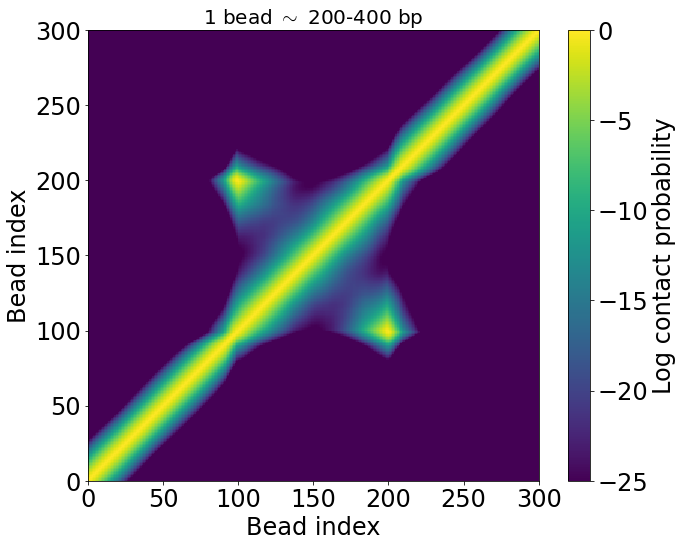

In [37]:
data_path = (ws_path /"21-09-16_aLchr1_looptail700_BBasym_rigid")
ss_ind = 600
end_ind = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][200:500,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-27_aLchr1_line700eq_500xl_conf

2401


/mnt/home/alamson/projects/analysis/AMSOS_Analysis/amsos_analysis/chrom_graph_funcs.py:228: RuntimeWarning: divide by zero encountered in log
  c0 = axarr[0].pcolorfast(X, Y, np.log(contact_mat[:, :, -1]), vmin=-50)


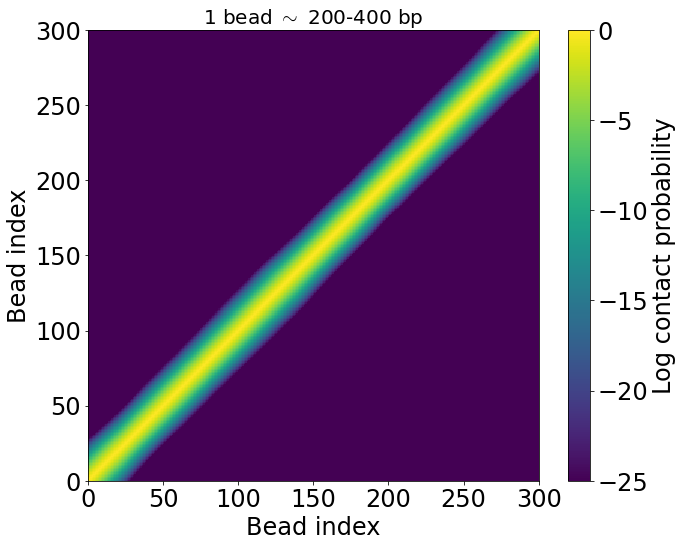

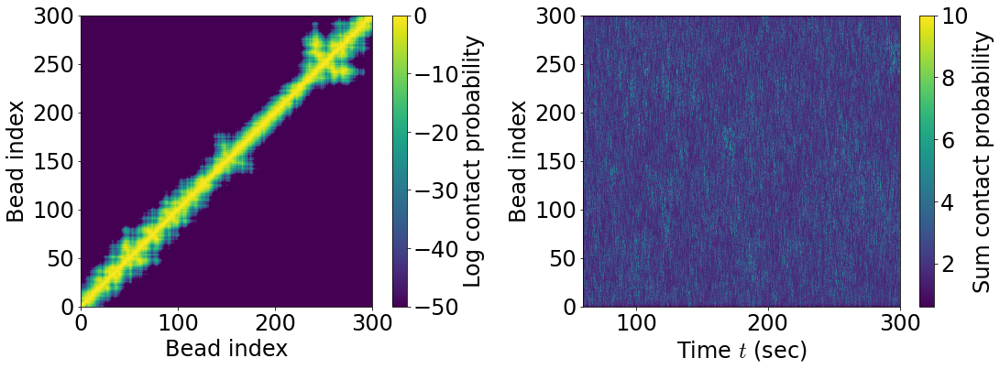

In [19]:
data_path = (ws_path /"21-09-27_aLchr1_line700eq_500xl_conf")
ss_ind = 600
end_ind = -1
start_bead = 200
end_bead = 500
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)


contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:-1], time_arr)

## 21-09-27_aLchr1_line700_sticky

3001


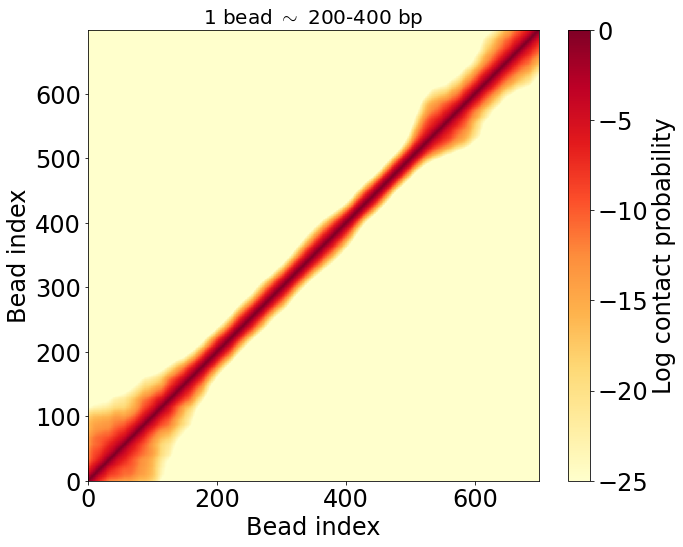

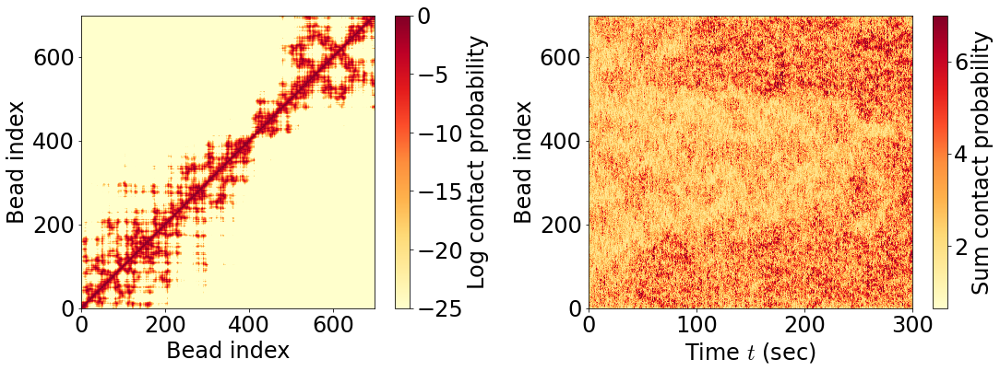

In [72]:
data_path = (ws_path /"21-09-27_aLchr1_line700_sticky")
ss_ind = 0
end_ind = -1
start_bead = 0
end_bead = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)


contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7)

## 21-09-30_aLchr1_line700_sticky_conf

3001


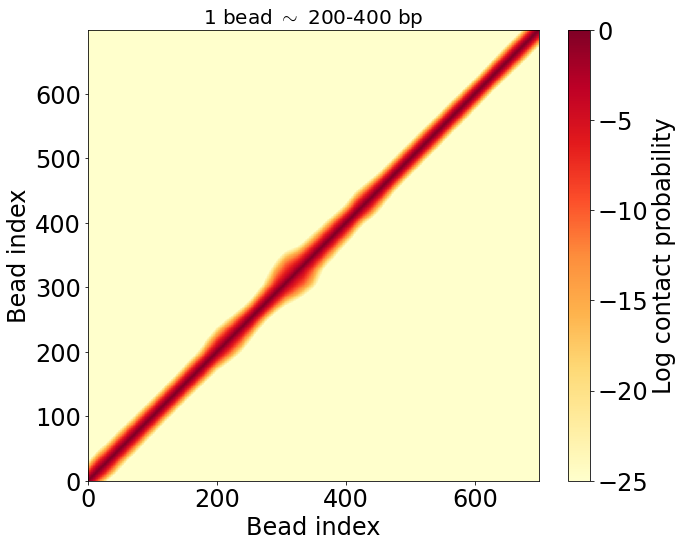

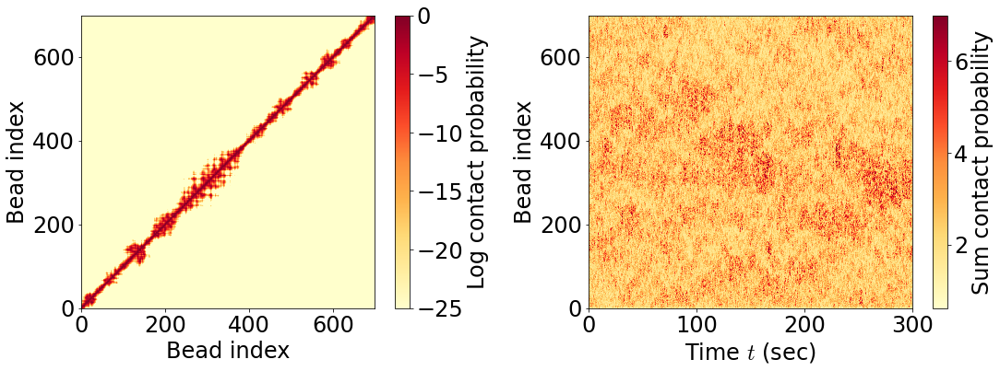

In [71]:
data_path = (ws_path /"21-09-30_aLchr1_line700_sticky_conf")
ss_ind = 0
end_ind = -1
start_bead = 0
end_bead = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)


contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7)

## 21-09-30_aLchr1_line700_sticky_conf_rigid

3001


/mnt/home/alamson/projects/analysis/AMSOS_Analysis/amsos_analysis/chrom_graph_funcs.py:228: RuntimeWarning: divide by zero encountered in log
  c0 = axarr[0].pcolorfast(X, Y, np.log(contact_mat[:, :, -1]), vmin=-50)


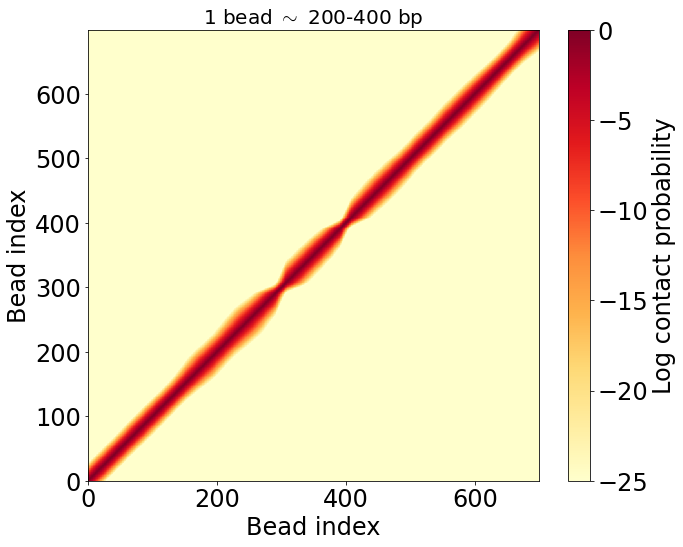

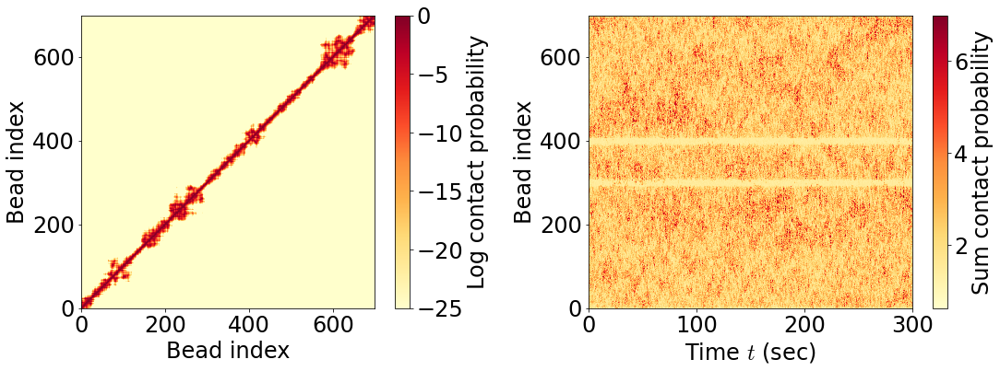

In [70]:
data_path = (ws_path /"21-09-30_aLchr1_line700_sticky_conf_rigid")
ss_ind = 0
end_ind = -1
start_bead = 0
end_bead = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)


contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7)

## 21-09-30_aLchr1_looptail700_sticky_conf

3001


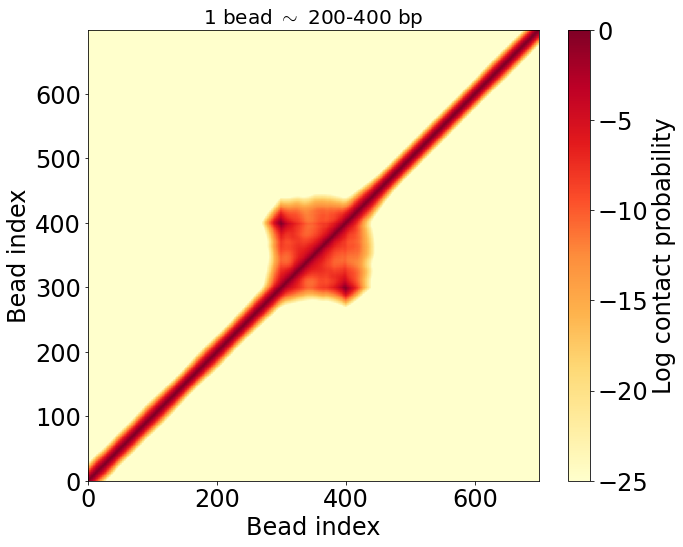

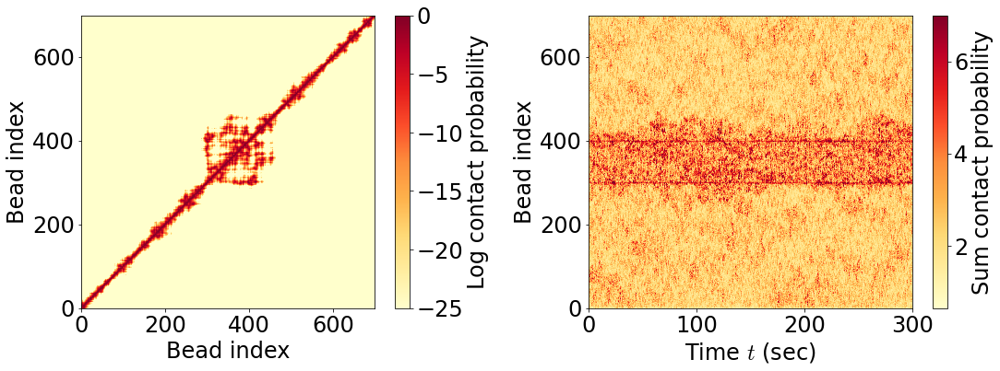

In [75]:
data_path = (ws_path /"21-09-30_aLchr1_looptail700_sticky_conf")
ss_ind = 0
end_ind = -1
start_bead = 0
end_bead = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)


contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7)

## 21-09-30_aLchr1_looptail700_stickyloop_conf

3001


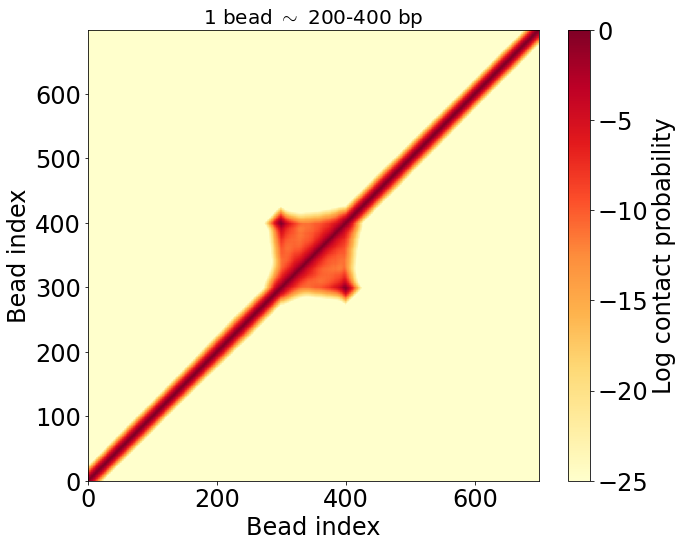

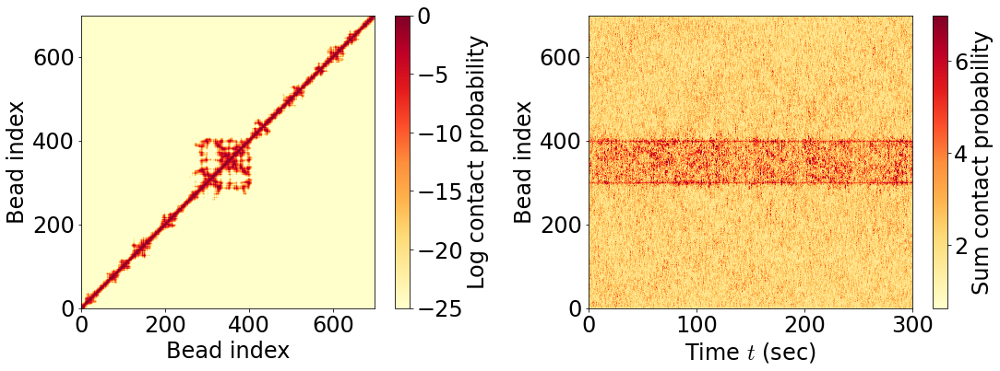

In [77]:
data_path = (ws_path /"21-09-30_aLchr1_looptail700_stickyloop_conf")
ss_ind = 0
end_ind = -1
start_bead = 0
end_bead = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)


contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7)

## 21-09-30_aLchr1_looptail700_sticky40_conf

3001


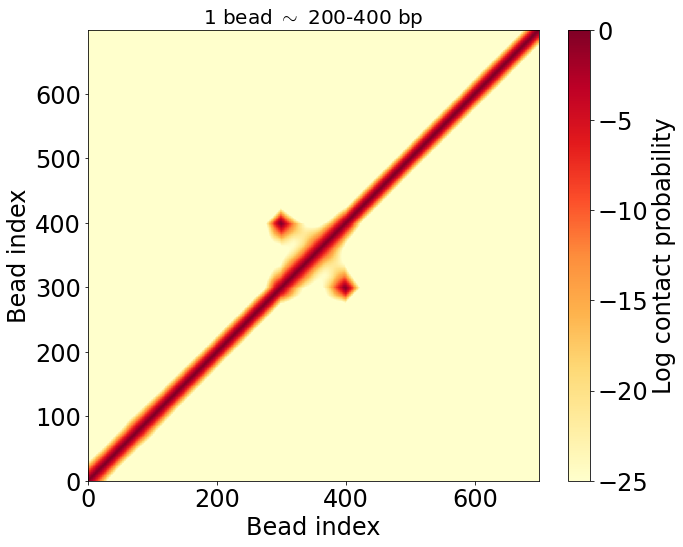

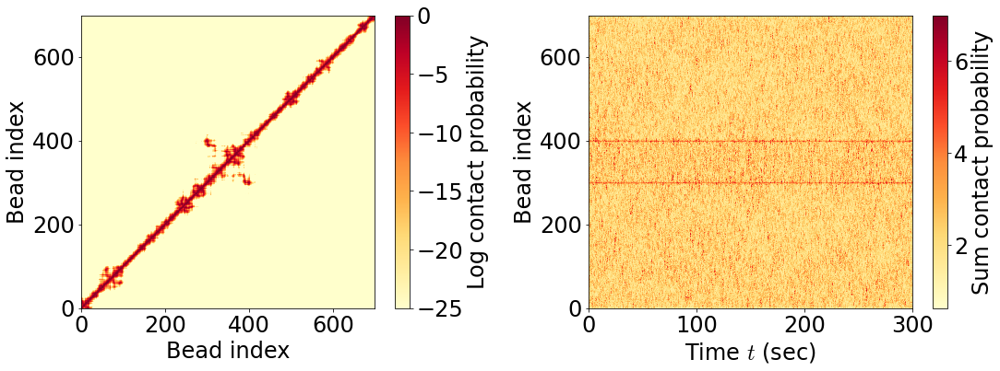

In [78]:
data_path = (ws_path /"21-09-30_aLchr1_looptail700_sticky40_conf")
ss_ind = 0
end_ind = -1
start_bead = 0
end_bead = -1
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:end_ind]
    print(time_arr.size)
    sy_dat = h5_data['raw_data']['sylinders'][start_bead:end_bead,:,ss_ind:end_ind]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[start_bead,end_bead])


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)

# Graphing
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)


contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
fig2, axarr2, contact_kymo = aa.make_summed_contact_kymo_graph(contact_mat[:,:,:end_ind], time_arr, vmin=-25, vmax=7)

# 800 bead looptails (Chetverina et al.)

## 21-08-18_aLchr1_4looptail800

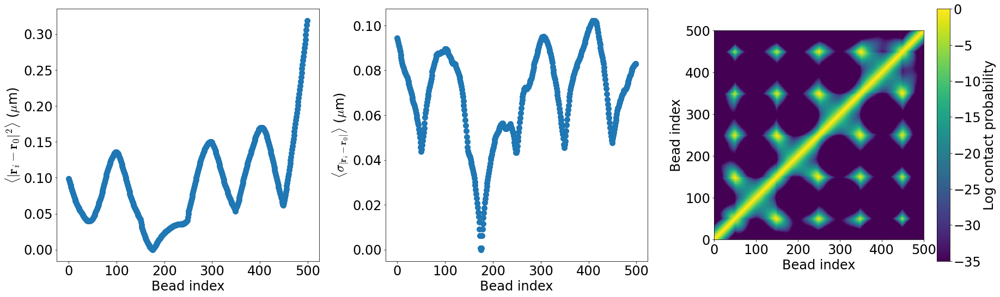

In [185]:
data_path = (ws_path /"21-08-18_aLchr1_4looptail800")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:650,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=175, hist_max=1., vmin=-35)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-18_aLchr1_4looptail800_rigid

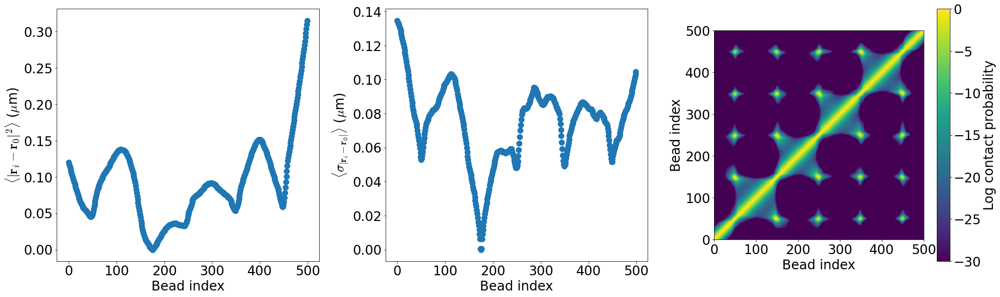

In [189]:
data_path = (ws_path /"21-08-18_aLchr1_4looptail800_rigid")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:650,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=175, hist_max=1., vmin=-30)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-18_aLchr1_4Blooptail800_Chet5CD

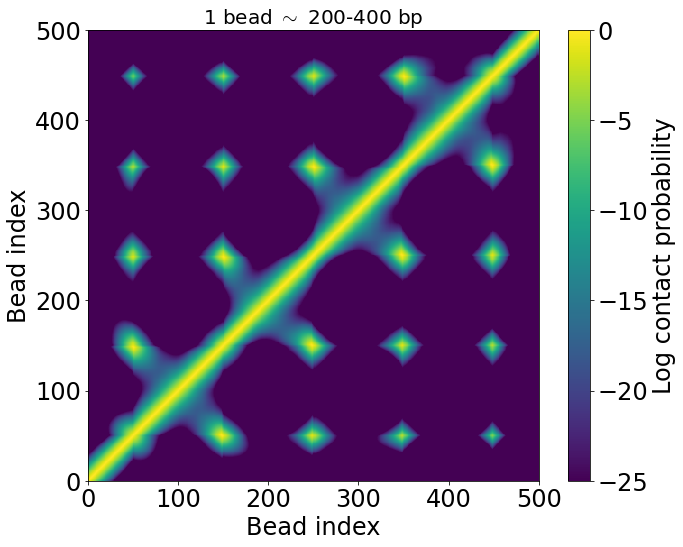

In [238]:
data_path = (ws_path /"21-08-18_aLchr1_4Blooptail800_Chet5CD")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:650,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-18_aLchr1_4Blooptail800_Chet5CD_rigid

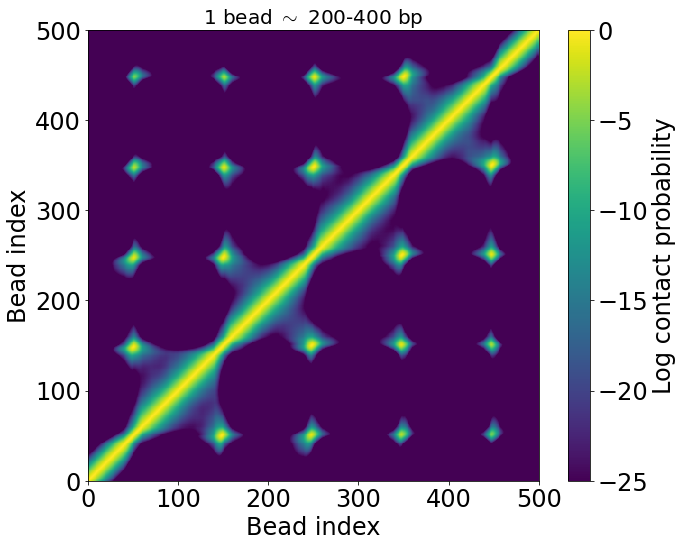

In [239]:
data_path = (ws_path /"21-08-18_aLchr1_4Blooptail800_Chet5CD_rigid")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:650,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-18_aLchr1_1-2-1looptail800_Chet5E

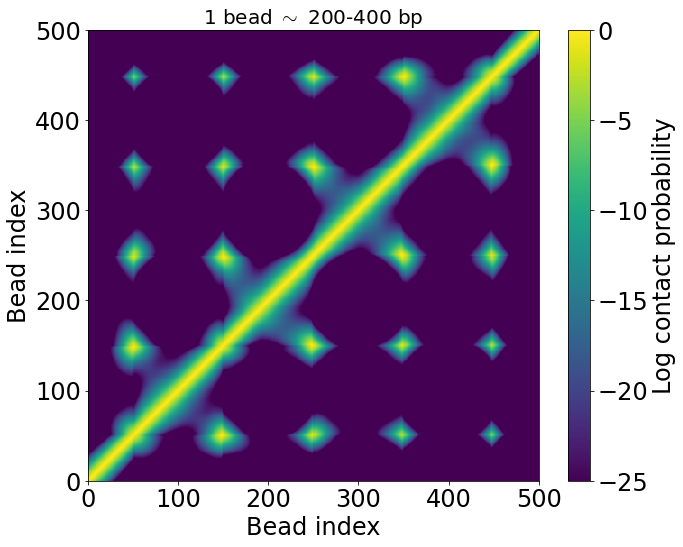

In [240]:
data_path = (ws_path /"21-08-18_aLchr1_1-2-1looptail800_Chet5E")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:650,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-18_aLchr1_1-2-1looptail800_Chet5E_rigid

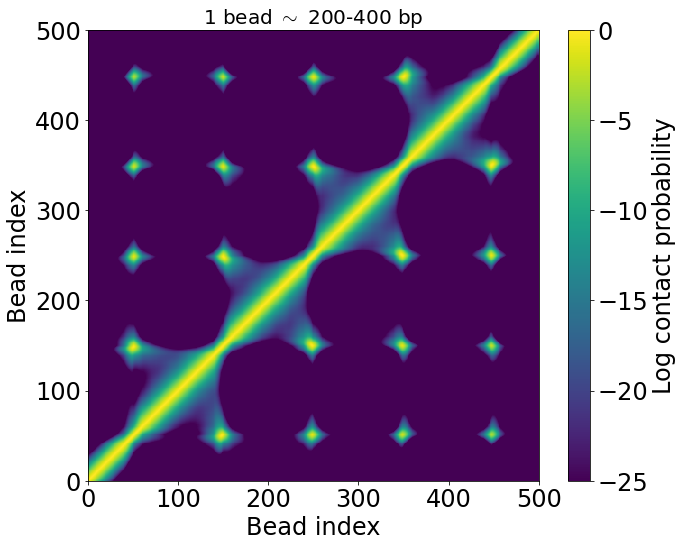

In [241]:
data_path = (ws_path /"21-08-18_aLchr1_1-2-1looptail800_Chet5E_rigid")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:650,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

##  21-09-01_aLchr1_4Blooptail800_Chet5CD_rigid_hydro

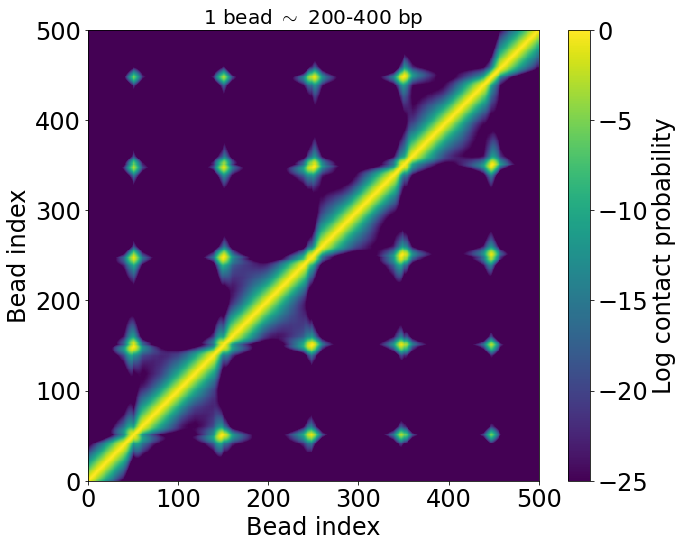

In [22]:
data_path = (ws_path /"21-09-01_aLchr1_4Blooptail800_Chet5CD_rigid_hydro")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:650,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-16_aLchr1_3Blooptail800_Chet5CD_loop2delete_rigid

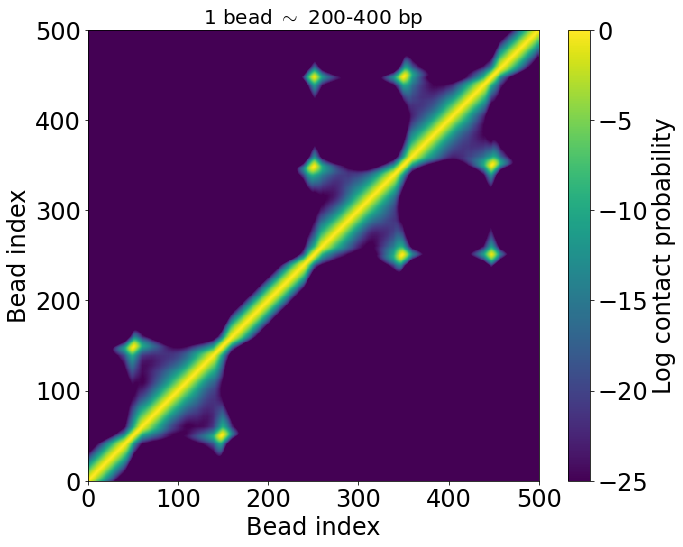

In [38]:
data_path = (ws_path /"21-09-16_aLchr1_3Blooptail800_Chet5CD_loop2delete_rigid")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:650,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-16_aLchr1_looptail800_NC14

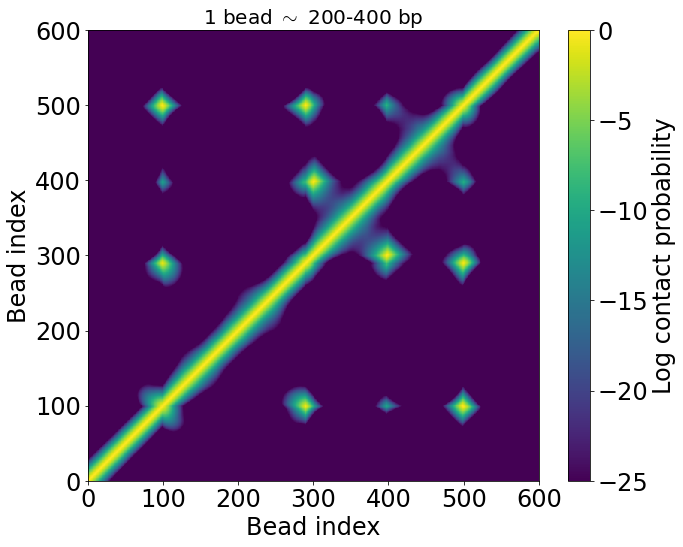

In [40]:
data_path = (ws_path /"21-09-16_aLchr1_looptail800_NC14")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][100:700,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-09-16_aLchr1_looptail800_NC14_rigid

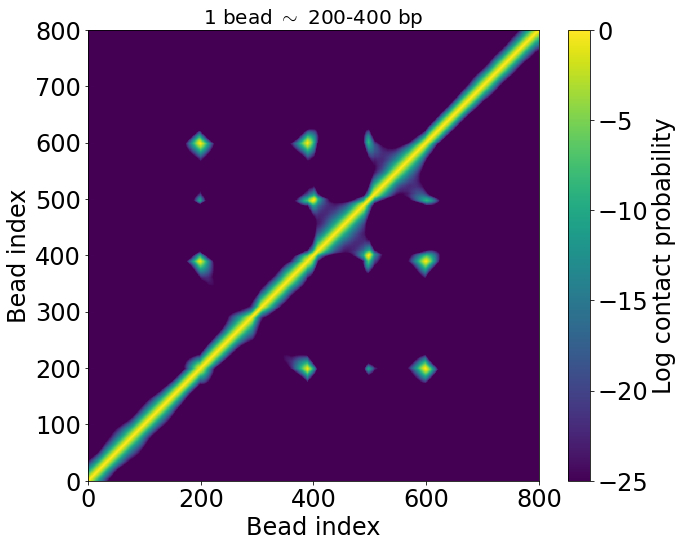

In [42]:
data_path = (ws_path /"21-09-16_aLchr1_looptail800_NC14_rigid")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

# LEF loops

## 21-08-26_aLchr1_LEF700

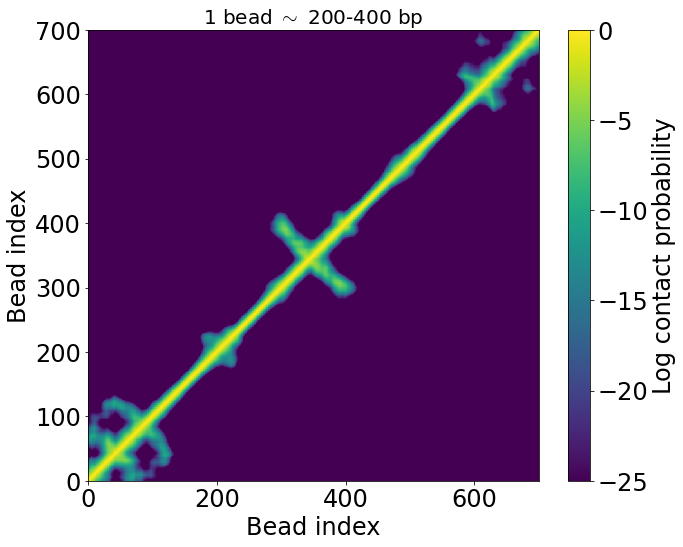

In [281]:
data_path = (ws_path /"21-08-26_aLchr1_LEF700")
ss_ind = 200
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-26_aLchr1_LEF700_conf

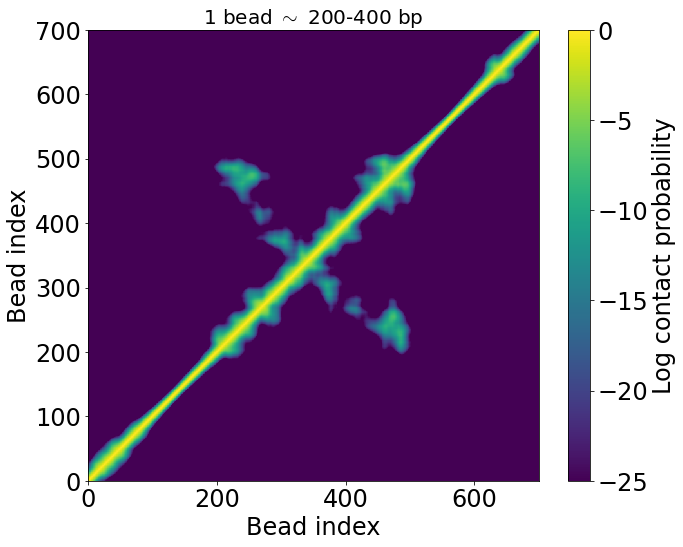

In [275]:
data_path = (ws_path /"21-08-26_aLchr1_LEF700_conf")
ss_ind = -400
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 21-08-26_aLchr1_LEF700_one-sided

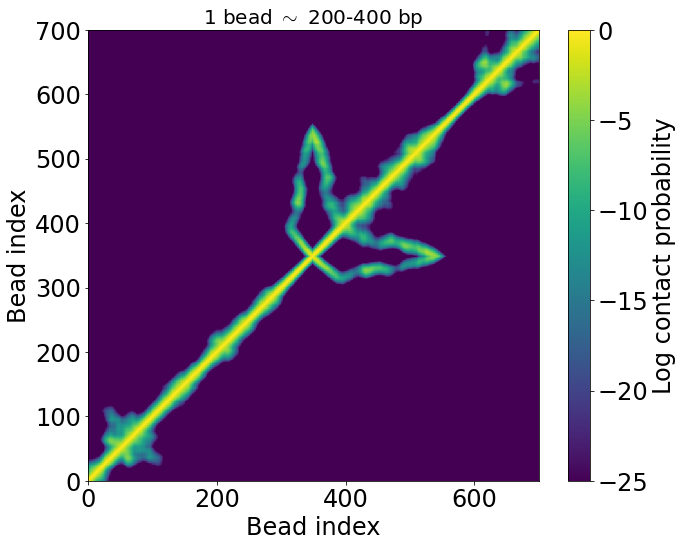

In [273]:
data_path = (ws_path /"21-08-26_aLchr1_LEF700_one-sided")
ss_ind = 800
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [49,150], [49,150], 1,2)
fig1, ax1 = aa.make_hic_plot(com_arr, log_contact_avg_mat, vmin=-25)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1., vmin=-25)
#fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

# 500 bead looptails (old)

## 500 looptail confined

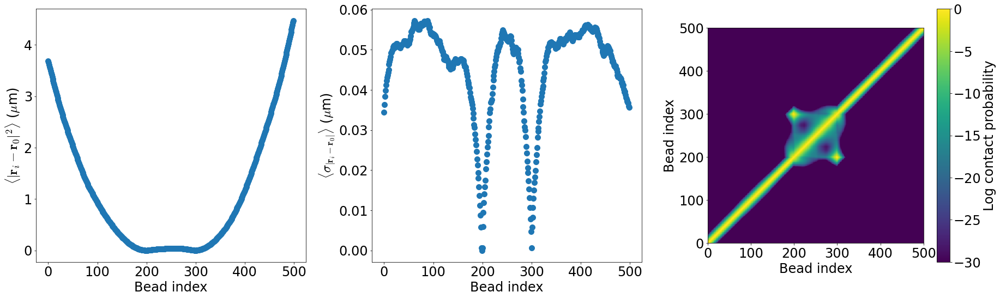

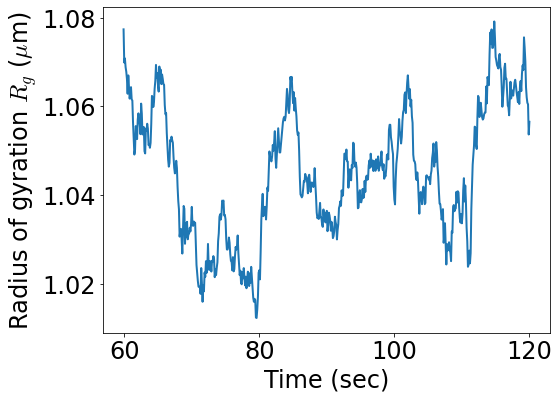

In [31]:
data_path = (ws_path /"21-08-06_AMchr1_looptail500_2links_conf")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [199,], [49,150], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=199, hist_max=1.)
fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 500 looptail rigid confined

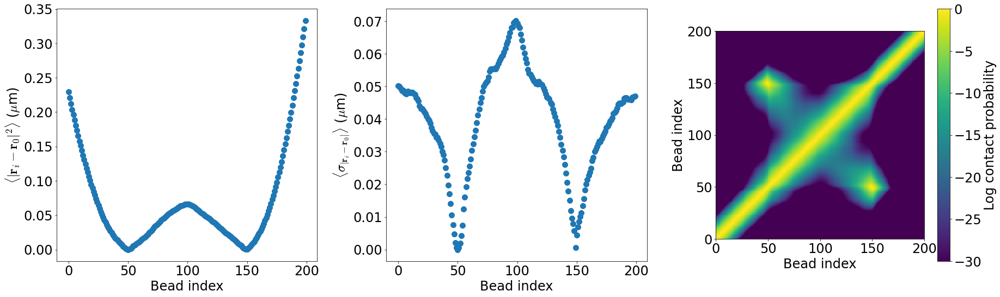

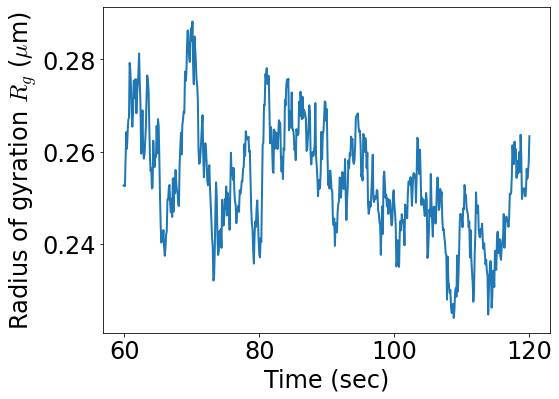

In [94]:
data_path = (ws_path /"21-08-06_AMchr1_looptail500_rigid_2links_conf")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:350,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [199,], [49,150], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1.)
fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 500 back-looptail

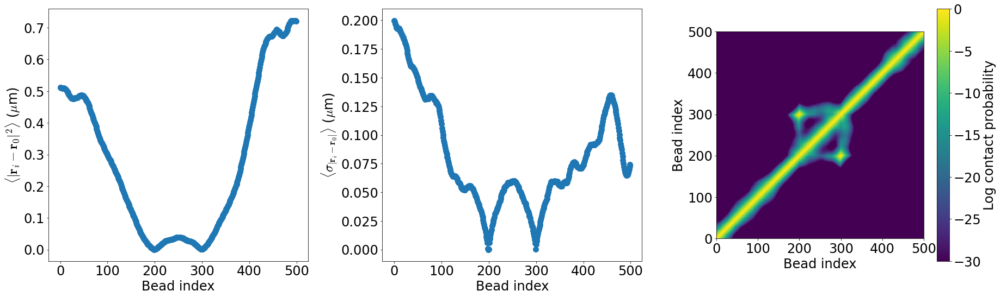

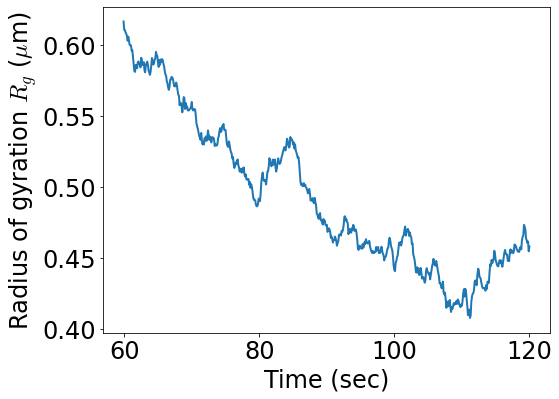

In [233]:
data_path = (ws_path /"21-08-09_AMchr1_Blooptail500_2links")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:500,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [199,], [49,150], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=199, hist_max=1.)
fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 500 back-looptail rigid

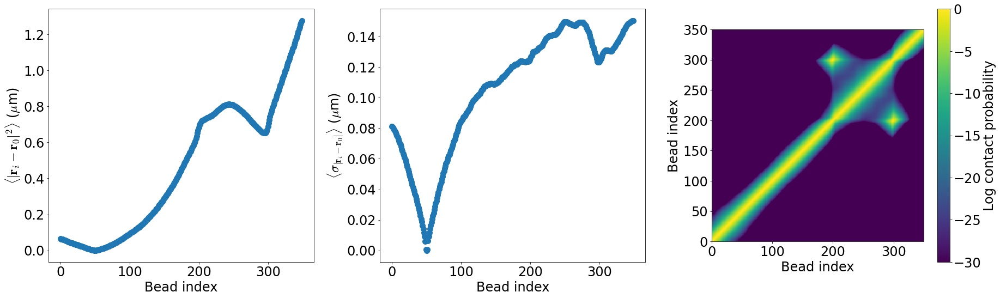

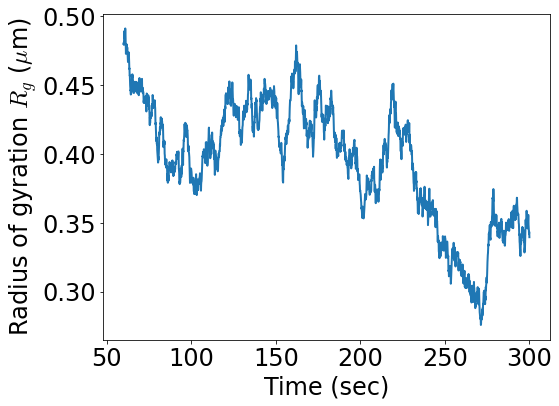

In [232]:
data_path = (ws_path /"21-08-09_AMchr1_Blooptail500_rigid_2links")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:350,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [199,], [49,150], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=50, hist_max=1.)
fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 500 back-looptail confined

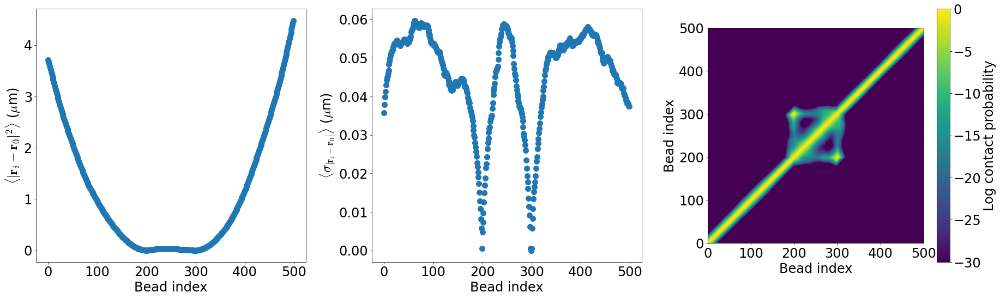

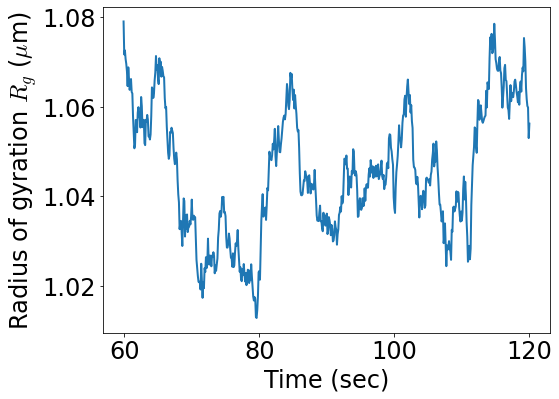

In [50]:
data_path = (ws_path /"21-08-09_AMchr1_Blooptail500_2links_conf")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [199,], [49,150], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=299, hist_max=1.)
fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 500 back-looptail rigid confined

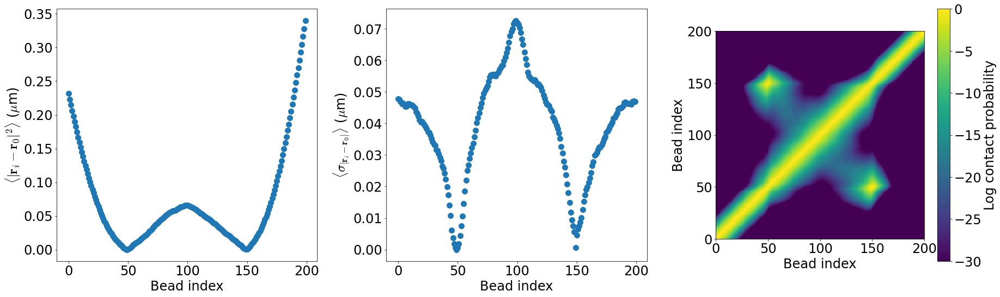

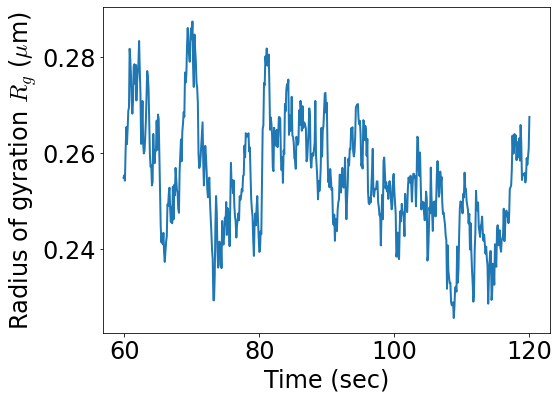

In [96]:
data_path = (ws_path /"21-08-09_AMchr1_Blooptail500_rigid_2links_conf")
ss_ind = 600
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][150:350,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 1)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
#fig0, ax0 = aa.make_segment_distr_graphs(com_arr, [199,], [49,150], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=49, hist_max=1.)
fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

# Conclusions and Next Steps